conm = company name

prccq= price-close quarter (The data for 2016 have a prccq for each quarter)

gvkey = global company key

tic = ticker symbol

**Melt data somehow?



# Term Project - Timlan Wong

![](banner_project.jpg)

In [1]:
cat("Open code cell here for notebook apparatus.")

options(warn=-1)

# Load some required functions
library(plyr,      verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(ggplot2, verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(caret,   verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(mclust,    verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(GGally,    verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(rgl,       verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE) # All rglwidget() calls must use elementID="myplot"
library(htmltools, verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(ggdendro,  verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(e1071,     verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(gridExtra, verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(neuralnet, verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(rpart,     verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(kknn,      verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(MLmetrics, verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
library(reshape2,  verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)

# Define some useful functions
size = function(data) data.frame(observations=dim(data)[1], variables=dim(data)[2])
num_columns = function(data) aaply(names(data), 1, function(j) { class(data[, j]) != "factor" })
full_columns = function(data) aaply(names(data), 1, function(j) { !any(is.na(data[, j])) })
vary_columns = function(data) aaply(names(data), 1, function(j) { length(unique(data[, j])) > 1 })
sd_columns = function(data) aaply(1:ncol(data), 1, function(j) sd(data[,j]))
var_columns = function(data) aaply(1:ncol(data), 1, function(j) var(data[,j]))                                   
pc_constituents = function(pc) { pc_names = names(as.data.frame(pc$rotation))
                                 qual = as.data.frame(t(adply(pc_names, 1, function(j) row.names(pc$rotation)[rev(order(abs(pc$rotation[,j])))])[-1]))
                                 names(qual) = pc_names
                                 row.names(qual) = NULL
                                 qual }
                                                              
as.class = function(prob, class, cutoff=NA) { f = factor(prob[,colnames(prob)==class]>=cutoff, levels=c(TRUE, FALSE), labels=c(class, setdiff(colnames(prob), class))); attr(f, "names") = NULL; f }
exhaustive = function(v, keep="class") { v = v[!v %in% keep]; unlist(lapply(1:length(v), function(j) lapply(j:length(v), function(i) c(v[j:i], keep))), recursive=FALSE) }
size = function(data) data.frame(observations=dim(data)[1], variables=dim(data)[2])
as.binary = function(v, s) { as.numeric(v == s) }
pick = function(v, f) { if (class(v) %in% c("data.frame", "matrix")) factor(colnames(v)[v == f(v)], levels=colnames(v)) else names(prob)[prob == max(prob)] }
round_robin = function(...) { tt = table(as.character(lapply(lapply(list(...), pick, max), as.character)))
                              factor(names(tt)[which.max(tt)], levels=unique(unlist(lapply(list(...), colnames)))) }
# Set some visualization constants
restore = list(repr.plot.width=8, repr.plot.height=2)
PALETTE = c("#00A9FF", "#F8766D", "#7CAE00", "#C77CFF", "#CD9600", "#00BE67", "#FF61CC", "#00BFC4")
theme.no_legend = theme(legend.position="none")
theme.no_x_axis_labels = theme(axis.text.x=element_blank(), axis.ticks.x=element_blank())

# Set some visualization formatting defaults
options(scipen=10)                         
options(repr.matrix.max.cols=1000)
options(repr.matrix.max.rows=1000)
options(restore)
update_geom_defaults("point", list(size=0.25, colour=PALETTE[1]))
update_geom_defaults("line", list(size=0.15))
update_geom_defaults("col", list(colour=NA, fill=PALETTE[1]))
theme_update(plot.title=element_text(size=10, hjust=0.5), plot.subtitle=element_text(size=8, face="italic", hjust=0.5), axis.title=element_text(size=7), axis.text=element_text(size=7), strip.text=element_text(size=7), strip.text.y=element_text(angle=90), legend.title=element_blank(), legend.text=element_text(size=7))

Open code cell here for notebook apparatus.

Package 'mclust' version 5.4.3
Type 'citation("mclust")' for citing this R package in publications.


## Analyst

* Timlan Wong

## Business Parameters

In [2]:
budget = 1000000

## Discussion

Describe the approach to model construction, evaluation, and how the model predictions inform the decision about how to invest. (250 to 1000+ words)

In this sample ...

Data is prepared by adding a variable populated by a 3-class cluster model, built using Gaussian mixture model estimation by expectation-maximization.  Then, a linear regression model is built to predict growth given cluster assignment and prices for all 4 quarters.  Then, investment is equally distributed among companies predicted to grow more than 10%. 

## Data

### Data Dictionary

In [3]:
dictionary = read.csv("Data Dictionary.csv")
size(dictionary)
dictionary

observations,variables
674,4


Variable.Name,Data.Type,Variable.Description,Help
ACCHGQ,NUM,ACCHGQ -- Accounting Changes - Cumulative Effect,NA
ACCHGY,NUM,ACCHGY -- Accounting Changes - Cumulative Effect,NA
ACCTCHGQ,CHAR,ACCTCHGQ -- Adoption of Accounting Changes,NA
ACCTSTDQ,CHAR,ACCTSTDQ -- Accounting Standard,NA
ACOMINCQ,NUM,ACOMINCQ -- Accumulated Other Comprehensive Income (Loss),NA
ACOQ,NUM,ACOQ -- Current Assets - Other - Total,NA
ACTQ,NUM,ACTQ -- Current Assets - Total,NA
ADD1,CHAR,ADD1 -- Address Line 1,NA
ADD2,CHAR,ADD2 -- Address Line 2,NA
ADD3,CHAR,ADD3 -- Address Line 3,NA


### Data for 2016, Quarters 1, 2, 3, 4

In [5]:
data.2016.q1 = read.csv("Company Fundamentals 2016-Q1 A.csv", header=TRUE)
data.2016.q2 = read.csv("Company Fundamentals 2016-Q2 A.csv", header=TRUE)
data.2016.q3 = read.csv("Company Fundamentals 2016-Q3 A.csv", header=TRUE)
data.2016.q4 = read.csv("Company Fundamentals 2016-Q4 A.csv", header=TRUE)

In [6]:
m12 = merge(data.2016.q1, data.2016.q2, by=c("gvkey", "tic", "conm"), suffixes=c(".q1",".q2"))
m34 = merge(data.2016.q3, data.2016.q4, by=c("gvkey", "tic", "conm"), suffixes=c(".q3",".q4"))
m1234 = merge(m12, m34, by=c("gvkey", "tic", "conm"))
data.2016 = m1234[order(m1234$tic),]
size(data.2016)
head(data.2016, 5)

observations,variables
3000,2711


gvkey  tic   conm                        datadate.q1 fyearq.q1 fqtr.q1
2484  62527 3AMFC AMB FINANCIAL CORP          20160331    2016      1      
2715  65924 3CSBB CSB BANCORP INC/OH          20160331    2016      1      
1449  21521 3CZFS CITIZENS FINANCIAL SVCS INC 20160331    2016      1      
255  119436 3FBPI FIRST BANCORP INDIANA INC   20160331    2016      3      
2410  61225 3FETM FENTURA FINANCIAL INC       20160331    2016      1      
     fyr.q1 indfmt.q1 consol.q1 popsrc.q1 datafmt.q1 cusip.q1  acctchgq.q1
2484 12     INDL      C         D         STD        001984103 NA         
2715 12     INDL      C         D         STD        12628R107 NA         
1449 12     INDL      C         D         STD        174615104 NA         
255   6     INDL      C         D         STD        31867T202 NA         
2410 12     INDL      C         D         STD        314645102 NA         
     acctstdq.q1 adrrq.q1 ajexq.q1 ajpq.q1 bsprq.q1 compstq.q1 curcdq.q1
2484 DS          NA       1.0000   1.0000  GB       NA         USD      
2715 DS          NA       1.0000   1.0000  GB       NA         USD      
1449 DS          NA       1.0605   1.0605  GB       NA         USD      
255  DS          NA       1.0000   1.0000  GB       NA         USD      
2410 DS          NA       1.0000   1.0000  GB       AC         USD      
     curncdq.q1 currtrq.q1 curuscnq.q1 datacqtr.q1 datafqtr.q1 finalq.q1
2484 USD        1          NA          2016Q1      2016Q1      Y        
2715 USD        1          NA          2016Q1      2016Q1      Y        
1449 USD        1          NA          2016Q1      2016Q1      Y        
255  USD        1          NA          2016Q1      2016Q3      Y        
2410 USD        1          NA          2016Q1      2016Q1      Y        
     ogmq.q1 rp.q1 scfq.q1 srcq.q1 staltq.q1 updq.q1 apdedateq.q1 fdateq.q1
2484 NA      Q      7       3      NA        3       20160331     20160622 
2715 NA      Q      7       5      NA        3       20160331     20160603 
1449 NA      Q      7       5      NA        3       20160331     20160523 
255  NA      Q     NA       3      NA        3       20160331     20160712 
2410 NA      Q     NA      20      NA        3       20160331     20170117 
     pdateq.q1 rdq.q1   acchgq.q1 acomincq.q1 acoq.q1 actq.q1 altoq.q1 ancq.q1
2484       NA  20160430 NA        0.021       NA      NA      NA       NA     
2715 20160421  20160419 NA        0.147       NA      NA      NA       NA     
1449 20160428  20160427 NA        0.903       NA      NA      NA       NA     
255        NA  20160427 NA           NA       NA      NA      NA       NA     
2410       NA  20160429 NA           NA       NA      NA      NA       NA     
     anoq.q1 aociderglq.q1 aociotherq.q1 aocipenq.q1 aocisecglq.q1 aol2q.q1
2484 NA       0             0             0.0         0                 NA 
2715  0       0             0             0.0         0            121.175 
1449  0       0             0            -2.4         0            364.502 
255  NA      NA            NA              NA        NA                 NA 
2410 NA      NA            NA              NA        NA                 NA 
     aoq.q1  apq.q1   aqaq.q1 aqdq.q1 aqepsq.q1 aqpl1q.q1 aqpq.q1 arcedq.q1
2484  13.874  167.104 NA      NA      NA           NA     NA      NA       
2715 173.223  509.980 NA      NA      NA        1.067     NA      NA       
1449 435.084 1017.811 NA      NA      NA        7.423     NA      NA       
255       NA  255.999 NA      NA      NA           NA     NA      NA       
2410  44.746  376.397 NA      NA      NA           NA     NA      NA       
     arceepsq.q1 arceq.q1 atq.q1   aul3q.q1 billexceq.q1 capr1q.q1 capr2q.q1
2484 NA          NA        190.161 NA       NA           12.53     1.25     
2715 NA          NA        637.202  0       NA           12.60     1.10     
1449 NA          NA       1192.564  0       NA           15.51     1.07     
255  NA          NA        402.650 NA       NA            8.90       NA  

### Data for 2017, Quarter 2

In [7]:
data.2017.q2 = read.csv("Company Price 2017-Q2 A.csv", header=TRUE)
size(data.2017.q2)
head(data.2017.q2)

observations,variables
3000,4


gvkey,tic,conm,prccq
1004,AIR,AAR CORP,34.94
1045,AAL,AMERICAN AIRLINES GROUP INC,50.32
1050,CECE,CECO ENVIRONMENTAL CORP,9.18
1062,ASA,ASA GOLD AND PRECIOUS METALS,11.88
1072,AVX,AVX CORP,16.34
1075,PNW,PINNACLE WEST CAPITAL CORP,85.16


In [8]:
data.2017 = data.2017.q2[order(data.2017.q2$tic), ]
data.2017$growth = data.2017$prccq / data.2016$prccq.q4
size(data.2017)
head(data.2017, 5)

observations,variables
3000,5


,gvkey,tic,conm,prccq,growth
2183,62527,3AMFC,AMB FINANCIAL CORP,17.00,1.1333333
2384,65924,3CSBB,CSB BANCORP INC/OH,30.60,0.9870968
1455,21521,3CZFS,CITIZENS FINANCIAL SVCS INC,53.99,1.0186792
2625,119436,3FBPI,FIRST BANCORP INDIANA INC,20.80,1.1028632
2116,61225,3FETM,FENTURA FINANCIAL INC,18.25,1.1406250


### All Data

In [9]:
data = cbind(data.2016, data.2017[, "growth", drop=FALSE])
size(data)
head(data)

observations,variables
3000,2712


gvkey  tic   conm                        datadate.q1 fyearq.q1 fqtr.q1
2484  62527 3AMFC AMB FINANCIAL CORP          20160331    2016      1      
2715  65924 3CSBB CSB BANCORP INC/OH          20160331    2016      1      
1449  21521 3CZFS CITIZENS FINANCIAL SVCS INC 20160331    2016      1      
255  119436 3FBPI FIRST BANCORP INDIANA INC   20160331    2016      3      
2410  61225 3FETM FENTURA FINANCIAL INC       20160331    2016      1      
1105  18301 3FKYS FIRST KEYSTONE CORP         20160331    2016      1      
     fyr.q1 indfmt.q1 consol.q1 popsrc.q1 datafmt.q1 cusip.q1  acctchgq.q1
2484 12     INDL      C         D         STD        001984103 NA         
2715 12     INDL      C         D         STD        12628R107 NA         
1449 12     INDL      C         D         STD        174615104 NA         
255   6     INDL      C         D         STD        31867T202 NA         
2410 12     INDL      C         D         STD        314645102 NA         
1105 12     INDL      C         D         STD        320654205 NA         
     acctstdq.q1 adrrq.q1 ajexq.q1 ajpq.q1 bsprq.q1 compstq.q1 curcdq.q1
2484 DS          NA       1.0000   1.0000  GB       NA         USD      
2715 DS          NA       1.0000   1.0000  GB       NA         USD      
1449 DS          NA       1.0605   1.0605  GB       NA         USD      
255  DS          NA       1.0000   1.0000  GB       NA         USD      
2410 DS          NA       1.0000   1.0000  GB       AC         USD      
1105 DS          NA       1.0000   1.0000  GB       NA         USD      
     curncdq.q1 currtrq.q1 curuscnq.q1 datacqtr.q1 datafqtr.q1 finalq.q1
2484 USD        1          NA          2016Q1      2016Q1      Y        
2715 USD        1          NA          2016Q1      2016Q1      Y        
1449 USD        1          NA          2016Q1      2016Q1      Y        
255  USD        1          NA          2016Q1      2016Q3      Y        
2410 USD        1          NA          2016Q1      2016Q1      Y        
1105 USD        1          NA          2016Q1      2016Q1      Y        
     ogmq.q1 rp.q1 scfq.q1 srcq.q1 staltq.q1 updq.q1 apdedateq.q1 fdateq.q1
2484 NA      Q      7       3      NA        3       20160331     20160622 
2715 NA      Q      7       5      NA        3       20160331     20160603 
1449 NA      Q      7       5      NA        3       20160331     20160523 
255  NA      Q     NA       3      NA        3       20160331     20160712 
2410 NA      Q     NA      20      NA        3       20160331     20170117 
1105 NA      Q      7       5      NA        3       20160331     20160524 
     pdateq.q1 rdq.q1   acchgq.q1 acomincq.q1 acoq.q1 actq.q1 altoq.q1 ancq.q1
2484       NA  20160430 NA        0.021       NA      NA      NA       NA     
2715 20160421  20160419 NA        0.147       NA      NA      NA       NA     
1449 20160428  20160427 NA        0.903       NA      NA      NA       NA     
255        NA  20160427 NA           NA       NA      NA      NA       NA     
2410       NA  20160429 NA           NA       NA      NA      NA       NA     
1105 20160430  20160429 NA        6.197       NA      NA      NA       NA     
     anoq.q1 aociderglq.q1 aociotherq.q1 aocipenq.q1 aocisecglq.q1 aol2q.q1
2484 NA       0             0             0.0         0                 NA 
2715  0       0             0             0.0         0            121.175 
1449  0       0             0            -2.4         0            364.502 
255  NA      NA            NA              NA        NA                 NA 
2410 NA      NA            NA              NA        NA                 NA 
1105  0       0             0             0.0         0            379.426 
     aoq.q1  apq.q1   aqaq.q1 aqdq.q1 aqepsq.q1 aqpl1q.q1 aqpq.q1 arcedq.q1
2484  13.874  167.104 NA      NA      NA           NA     NA      NA       
2715 173.223  509.980 NA      NA      NA        1.067     NA      NA       
1449 435.084 1017.811 NA      NA      NA        7.423     NA      NA       
255  

## Data Exploration

### Preliminary Exploration

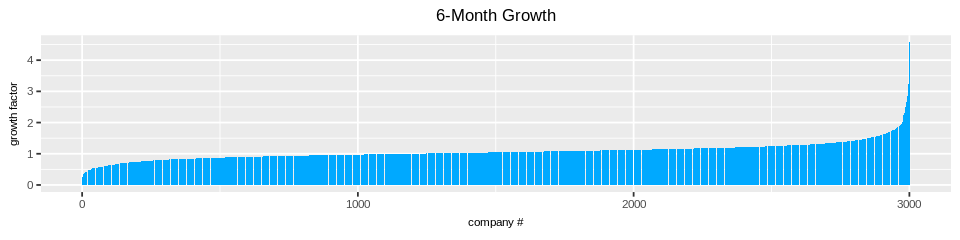

In [10]:
data.ok = data[order(data$growth),]

ggplot(data.ok) + ggtitle("6-Month Growth") + xlab("company #") + ylab("growth factor") +
geom_col(aes(x=1:nrow(data.ok), y=growth))

In [11]:
head(data.ok[, c("gvkey","tic","conm","growth")], 5)

,gvkey,tic,conm,growth
552,14062,CCDBF,CCL INDUSTRIES -CL B,0.2487111
2997,9835,PES,PIONEER ENERGY SERVICES CORP,0.2992701
1182,18982,EGLT,EGALET CORP,0.3098039
1386,20645,ARDX,ARDELYX INC,0.3591549
717,149379,FTFT,FUTURE FINTECH GROUP INC,0.3651515


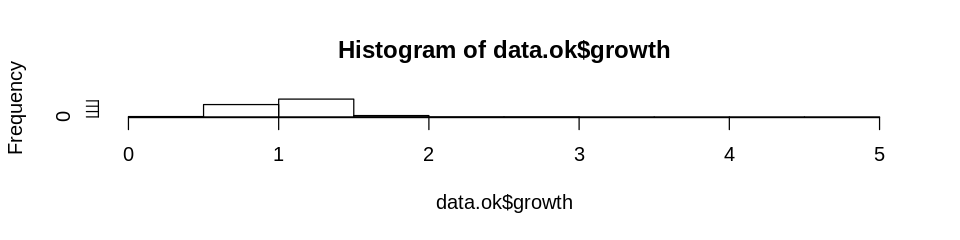

In [12]:
hist(data.ok$growth)

In [13]:
mean(data.2016$prccq.q4)
min(data.2016$prccq.q4)
max(data.2016$prccq.q4)


mean(data.2017$prccq)
min(data.2017$prccq)
max(data.2017$prccq)

[1] 48.00156

[1] 2.02

[1] 6800

[1] 52.90624

[1] 2.05

[1] 10000

In [14]:
min(data.ok$growth)
max(data.ok$growth)
mean(data.ok$growth)

[1] 0.2487111

[1] 4.569231

[1] 1.070577

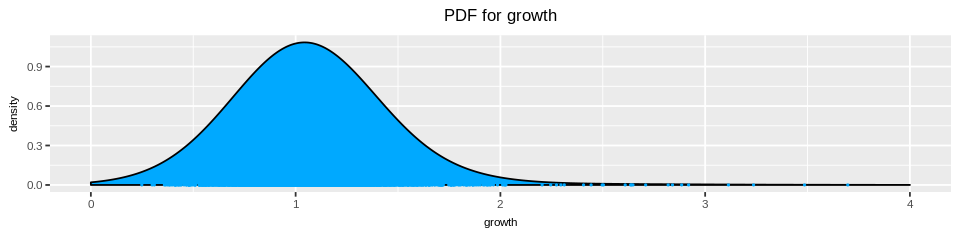

In [15]:
ggplot(data.ok) + ggtitle("PDF for growth") +
     geom_density(aes(x=growth), kernel="gaussian", bw=0.3, fill=PALETTE[1]) +
geom_point(aes(x = growth, y = 0)) + xlim(0,4)

We see from the above KDE plot that most of the values of growth from the companies is above a density of 1, which suggests that there is an overall increase in growth from the end of 2016 to the beginning of 2017.

In the next cell, let's determine how probabable a new observation will measure between the different growth intervals:

0 < growth < 1

1 < growth < 2

2 < growth < 3

3 < growth < 4

4 < growth < 5

In [16]:
d = density(data.ok$growth, kernel="gaussian", bw=1, from=0, to=5, n=500)
d


Call:
	density.default(x = data.ok$growth, bw = 1, kernel = "gaussian",     n = 500, from = 0, to = 5)

Data: data.ok$growth (3000 obs.);	Bandwidth 'bw' = 1

       x              y            
 Min.   :0.00   Min.   :0.0006688  
 1st Qu.:1.25   1st Qu.:0.0143366  
 Median :2.50   Median :0.1462456  
 Mean   :2.50   Mean   :0.1699042  
 3rd Qu.:3.75   3rd Qu.:0.3212791  
 Max.   :5.00   Max.   :0.3868613  

In [17]:
pdf = approxfun(d)

sprintf("The probability that a new observation will measure between 0 < growth < 1 is %s", integrate(pdf, 0, 1)$value)
data.frame(probability_growth_is_0_to_1 = integrate(pdf, 0, 1)$value)

sprintf("The probability that a new observation will measure between 1 < growth < 2 is %s", integrate(pdf, 1, 2)$value)
data.frame(probability_growth_is_1_to_2 = integrate(pdf, 1, 2)$value)

sprintf("The probability that a new observation will measure between 2 < growth < 3 is %s", integrate(pdf, 2, 3)$value)
data.frame(probability_growth_is_2_to_3 = integrate(pdf, 2, 3)$value)

sprintf("The probability that a new observation will measure between 3 < growth < 4 is %s", integrate(pdf, 3, 4)$value)
data.frame(probability_growth_is_3_to_4 = integrate(pdf, 3, 4)$value)

sprintf("The probability that a new observation will measure between 4 < growth < 5 is %s", integrate(pdf, 4, 5)$value)
data.frame(probability_growth_is_4_to_5 = integrate(pdf, 4, 5)$value)

[1] "The probability that a new observation will measure between 0 < growth < 1 is 0.324728303622953"

probability_growth_is_0_to_1
0.3247283


[1] "The probability that a new observation will measure between 1 < growth < 2 is 0.341830857709935"

probability_growth_is_1_to_2
0.3418309


[1] "The probability that a new observation will measure between 2 < growth < 3 is 0.15137601796995"

probability_growth_is_2_to_3
0.151376


[1] "The probability that a new observation will measure between 3 < growth < 4 is 0.0292334361392708"

probability_growth_is_3_to_4
0.02923344


[1] "The probability that a new observation will measure between 4 < growth < 5 is 0.00291381385657697"

probability_growth_is_4_to_5
0.002913814


In [18]:
sprintf("The probability that a new observation will measure between 1 < growth < 3 is %s", integrate(pdf, 1, 3)$value)
data.frame(probability_growth_is_1_to_3 = integrate(pdf, 1, 3)$value)

[1] "The probability that a new observation will measure between 1 < growth < 3 is 0.493205366279599"

probability_growth_is_1_to_3
0.4932054


We see that the most likely growth of a new company is between 1 to 2 (34%), and overall roughly 66% of new companies will fall in the growth of 0 - 2, and roughly 50% of new observations will have a growth of 1 - 3. This confirms our initial inspection that the mean growth is 1.07 for the current companies.

Using this analysis, we should split our observations into groups. Companies with a low growth will be put into a group known as "low growth" with values between 0 - 1. Companies with a growth between 1 - 3 will be put into a group known as "high growth." Companies with a growth between 3 - 5 will be put into a group known as "very high growth."

For the purpose of easier analysis, I will name the above groups A, B, and C, respectively. Later, I will use cluster analysis to see how well these groups are separated out.

In [19]:
data.ok$growth_range = data.ok$growth

In [20]:
data.ok[data.ok$growth_range >= 0 & data.ok$growth_range <= 1, "growth_range"] <- "Low Growth"
data.ok[data.ok$growth_range > 1 & data.ok$growth_range <= 3, "growth_range"] <- "High Growth"
data.ok[data.ok$growth_range > 3 & data.ok$growth_range <= 5, "growth_range"] <- "Very High Growth"

In [21]:
unique(data.ok$growth_range)

[1] "Low Growth"       "High Growth"      "Very High Growth"

In [22]:
data.ok[data.ok$growth_range == "Very High Growth", "growth_range"]

[1] "Very High Growth" "Very High Growth" "Very High Growth" "Very High Growth"
[5] "Very High Growth"

In [23]:
head(data.ok[, c("growth","growth_range")])
tail(data.ok[, c("growth","growth_range")])

,growth,growth_range
552,0.2487111,Low Growth
2997,0.2992701,Low Growth
1182,0.3098039,Low Growth
1386,0.3591549,Low Growth
717,0.3651515,Low Growth
2883,0.3735352,Low Growth


,growth,growth_range
225,2.919048,High Growth
2662,3.113699,Very High Growth
890,3.236383,Very High Growth
979,3.485294,Very High Growth
1085,3.696486,Very High Growth
1460,4.569231,Very High Growth


In [24]:
growth = data.ok[data.ok$growth_range == "High Growth", ]
growth = rbind(growth, data.ok[data.ok$growth_range == "Very High Growth", ])
no_growth = data.ok[data.ok$growth_range == "Low Growth", ]

In [25]:
dim(growth)
dim(no_growth)
sum(nrow(growth), nrow(no_growth)) == nrow(data.ok)

[1] 1815 2713

[1] 1185 2713

[1] TRUE

### More Exploration

The ultimate goal of the project is to predict which companies to invest in. In order to do this, we should identify features that are useful for a model and be able to predict which companies have the highest growth.

First, I will begin with a method known as PCA in order to identify which numerical variables contain the most variance in the dataset. I will then use these variables in the 6 predictive analytic methods, which will then create models and give the accuracy of predicting the growth of companies.

First, let's see how much variables in our data frame are numerical and how many are categorical.

In [26]:
num_categorical = ncol(data.ok[, sapply(data.ok, class) %in% c('character', 'factor')])
num_numerical = ncol(data.ok) - num_categorical
sprintf("There are %s columns with numerical values", num_numerical)
sprintf("There are %s columns with categorical values", num_categorical)

[1] "There are 2558 columns with numerical values"

[1] "There are 155 columns with categorical values"

 Next, let us see whether there are any columns with missing (NA) values.

In [27]:
sprintf("There are %s columns with at least one missing values in our data", length(colnames(data.ok)[colSums(is.na(data.ok)) > 0]))

[1] "There are 2578 columns with at least one missing values in our data"

Let's see how many NA values are in which column.

In [28]:
NA_vals_each_column = colSums(is.na(data.ok))
head(NA_vals_each_column)
tail(NA_vals_each_column)

gvkey         tic        conm datadate.q1   fyearq.q1     fqtr.q1 
          0           0           0           0           0           0

stko.q4    weburl.q4     dldte.q4   ipodate.q4       growth growth_range 
          12           47         2933         1504            0            0

Let's get a feel for the distribution of how many NA values are in each column by taking a look at a histogram.

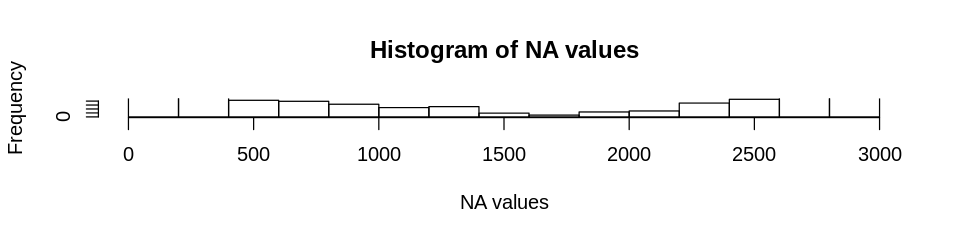

In [29]:
hist(as.vector(NA_vals_each_column), xlab="NA values",main="Histogram of NA values", ylim=c(0,90))

In [30]:
c("mean:", mean(as.vector(NA_vals_each_column)), "median:", median(as.vector(NA_vals_each_column)))

[1] "mean:"            "1709.15075562108" "median:"          "2421"

Based on this histogram, a lot of the values fall between 500 and 2500. Let us get rid of columns that have greater than 2700 NA values (greater than 90%). Let us see how many that is.

In [31]:
sprintf("%s columns have greater than 2700 NA values", sum(as.vector(NA_vals_each_column) > 2700))

[1] "1167 columns have greater than 2700 NA values"

In [32]:
sprintf("%s percent of the columns have greater than 2700 NA values", round(sum(as.vector(NA_vals_each_column) > 2700) / ncol(data.ok) * 100))

[1] "43 percent of the columns have greater than 2700 NA values"

I will keep the columns that have less than 2700 NA values and impute the NA values of the numerical columns with a more representative value, such as the mean of the column

In [33]:
ncol(data.ok)

[1] 2713

In [34]:
keep_percent = 0.9 * nrow(data.ok)
data_subsetted = data.ok[, colSums(!is.na(data.ok)) >= keep_percent]

In [35]:
ncol(data_subsetted)

[1] 800

In [36]:
##reality check: Should be higher
ncol(data.ok[, colSums(!is.na(data.ok)) >= 10])

[1] 2249

In order to use PCA, however, the system can only handle so much PC values. Currently, we have over 1000 numerical columns. We should try to get down to at least a number so that the system will be able to handle the code. To do this, let us set a threshold. I will only keep all numerical columns with fewer than 100 PC values, and impute those values with a more representative value, such as the mean of the column.

In [37]:
data_subsetted_numeric = data_subsetted[sapply(data_subsetted, is.numeric)]

In [38]:
data_subsetted_numeric = data_subsetted_numeric[, colSums(is.na(data_subsetted_numeric)) < 50]

In [39]:
dim(data_subsetted_numeric)

[1] 3000  273

In [40]:
for(i in 1:ncol(data_subsetted_numeric)){
  data_subsetted_numeric[is.na(data_subsetted_numeric[,i]), i] <- mean(data_subsetted_numeric[,i], na.rm = TRUE)
}

Let us confirm that the data has no more NA values in the next cell.

In [41]:
any(is.na(data_subsetted_numeric))

[1] FALSE

Let's now perform PCA on this data in order to find out which variables contain the most variation in the dataset. However, let's omit the growth column since that is what we are trying to predict, and we do not want to include it in the clustering and predictive analytic section by mistake.

See below

In [42]:
dim(data_subsetted_numeric)

[1] 3000  273

In [43]:
no_growth_column = grep("growth", colnames(data_subsetted_numeric))

In [44]:
data_subsetted_numeric_no_growth = data_subsetted_numeric[, -no_growth_column]

In [45]:
pc = prcomp(data_subsetted_numeric_no_growth, scale=TRUE, retx=TRUE)

In [46]:
head(as.data.frame(pc$center),5)

,pc$center
gvkey,43239.628667
datadate.q1,20160314.465333
fyearq.q1,2015.904333
fqtr.q1,1.416333
fyr.q1,10.586333


In [47]:
head(pc$rotation,5)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,PC81,PC82,PC83,PC84,PC85,PC86,PC87,PC88,PC89,PC90,PC91,PC92,PC93,PC94,PC95,PC96,PC97,PC98,PC99,PC100,PC101,PC102,PC103,PC104,PC105,PC106,PC107,PC108,PC109,PC110,PC111,PC112,PC113,PC114,PC115,PC116,PC117,PC118,PC119,PC120,PC121,PC122,PC123,PC124,PC125,PC126,PC127,PC128,PC129,PC130,PC131,PC132,PC133,PC134,PC135,PC136,PC137,PC138,PC139,PC140,PC141,PC142,PC143,PC144,PC145,PC146,PC147,PC148,PC149,PC150,PC151,PC152,PC153,PC154,PC155,PC156,PC157,PC158,PC159,PC160,PC161,PC162,PC163,PC164,PC165,PC166,PC167,PC168,PC169,PC170,PC171,PC172,PC173,PC174,PC175,PC176,PC177,PC178,PC179,PC180,PC181,PC182,PC183,PC184,PC185,PC186,PC187,PC188,PC189,PC190,PC191,PC192,PC193,PC194,PC195,PC196,PC197,PC198,PC199,PC200,PC201,PC202,PC203,PC204,PC205,PC206,PC207,PC208,PC209,PC210,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220,PC221,PC222,PC223,PC224,PC225,PC226,PC227,PC228,PC229,PC230,PC231,PC232,PC233,PC234,PC235,PC236,PC237,PC238,PC239,PC240,PC241,PC242,PC243,PC244,PC245,PC246,PC247,PC248,PC249,PC250,PC251,PC252,PC253,PC254,PC255,PC256,PC257,PC258,PC259,PC260,PC261,PC262,PC263,PC264,PC265,PC266,PC267,PC268,PC269,PC270,PC271,PC272
gvkey,0.008055042,-0.001147608,0.02405370,-0.01904768,0.006881321,-0.010516959,0.023553618,-0.03326776,0.050222777,-0.032324465,0.003573425,-0.022994868,0.032052044,-0.00209924,-0.006425021,-0.00166618,0.01406021,-0.0007938077,-0.043759078,-0.02750583,0.004810403,-0.01153443,0.023919451,-0.01228176,0.030615887,-0.04841130,0.003065337,-0.029752301,0.02810814,-0.287159543,0.004378058,-0.10041563,0.050268530,-0.0346890025,0.0716780401,-0.138171052,0.371479575,0.053026881,-0.523715412,0.578823803,0.17291664,0.08147792,0.2142394719,-0.068003977,-0.069772912,0.049035170,-0.093090642,-0.0364779438,0.047974996,-0.0069246892,-0.013413909,0.04673498,0.0039666188,0.028794604,-0.00003278936,-0.0006351691,-0.011178293,-0.0056613183,0.0260832365,-0.013607007,-0.0153854452,-0.003593214,-0.002474200,0.0003733478,0.015337493,0.0004898274,0.0014140281,0.010842660,-0.012716799,-0.009474461,-0.01290699,-0.005904885,-0.0023335925,0.007343079,-0.01095709,0.003436617,-0.0046376511,0.004196656,-0.0024274833,0.0036998438,-0.009114234,0.010732198,-0.00284823110,0.0008925132,-0.002925532,0.003145947,-0.005496386,0.002659946,-0.001708063,0.002734573,-0.00008941023,0.002064027,-0.0004854573,0.0005501995,0.0005839016,-0.00397047,0.0020724162,0.002440671,-0.0014299888,-0.002583793,0.001190702,-0.001042991,-0.0007290116,-0.002957888,0.002814332,0.002547908,0.002917857,-0.002571313,-0.0004301795,0.0032055513,0.0008664541,0.001059569,0.0008037143,-0.001373596,-0.0008875575,0.002100543,0.0017083257,0.00031038685,0.0007529466,-0.0025978510,-0.0004291499,-0.0008382914,-0.0006644571,-0.0020147367,0.0006286727,0.001255613,0.0008854852,0.0002588459,0.0008349227,-0.001026530,-0.0010526542,-0.0001206136,-0.0004720533,-0.0010273638,-0.0003294824,0.0007356372,0.0004994289,0.0001260852,0.0003444027,0.0005660933,0.0008187145,0.0005575762,0.0002398561,0.0002019875,0.0004617879,0.0003668018,-0.000472463,-0.0004446358,-0.0001633274,-0.0002183905,-0.000168422671,-0.000001586496,-0.0004193467,-0.00007356099,-0.0001356488,-0.00007740876,-0.00049274270,-0.0003856488,-0.000003330868,0.0002899261,0.00001313112,0.00004273814,0.00004725779,0.00007906353,0.000062928,0.0001287146,0.000006326381,0.0000132173,0.000008877887,0.0001945843,0.00009680567,0.00007841684,0.0000481346,0.00002366223,0.0001616788,0.00007486473,0.00008933843,0.00020697161,0.00008113714,0.0001144577,0.000027282,0.00006286475,0.00004548279,0.000046702540,0.0000161849,0.0000116040,0.00005326297,0.00004499854,0.00000216790

In [48]:
data.pc = as.data.frame(pc$x)

In [49]:
variable = names(data.pc)
sdev = as.vector(sapply(data.pc, sd))
variance = as.vector(sapply(data.pc, var))
cum_variance = cumsum(variance)
relative_variance = variance / sum(variance)
cum_relative_variance = cumsum(relative_variance)

df.pc = data.frame(variable, sdev, variance, cum_variance, relative_variance, cum_relative_variance)

variable,sdev,variance,cum_variance,relative_variance,cum_relative_variance
PC1,7.637318,58.32863,58.32863,0.21444349,0.2144435
PC2,6.737087,45.38835,103.71698,0.16686892,0.3813124
PC3,4.252959,18.08766,121.80464,0.06649876,0.4478112
PC4,3.746969,14.03978,135.84442,0.05161683,0.4994280
PC5,3.562645,12.69244,148.53686,0.04666338,0.5460914


In [50]:
head(df.pc,11)

variable,sdev,variance,cum_variance,relative_variance,cum_relative_variance
PC1,7.637318,58.328630,58.32863,0.21444349,0.2144435
PC2,6.737087,45.388347,103.71698,0.16686892,0.3813124
PC3,4.252959,18.087662,121.80464,0.06649876,0.4478112
PC4,3.746969,14.039778,135.84442,0.05161683,0.4994280
PC5,3.562645,12.692439,148.53686,0.04666338,0.5460914
PC6,3.432459,11.781776,160.31863,0.04331535,0.5894067
PC7,3.067610,9.410230,169.72886,0.03459643,0.6240032
PC8,2.759226,7.613330,177.34219,0.02799018,0.6519933
PC9,2.546538,6.484854,183.82705,0.02384138,0.6758347
PC10,2.373661,5.634264,189.46131,0.02071421,0.6965489


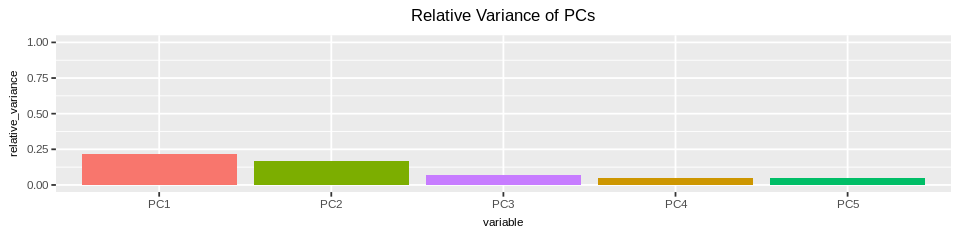

In [51]:
ggplot(df.pc[1:5, ]) + geom_col(aes(x = variable, y = relative_variance, fill = variable)) +
scale_fill_manual(values = PALETTE[2:6]) + ylim(0,1) + theme(legend.position="none") + ggtitle("Relative Variance of PCs")

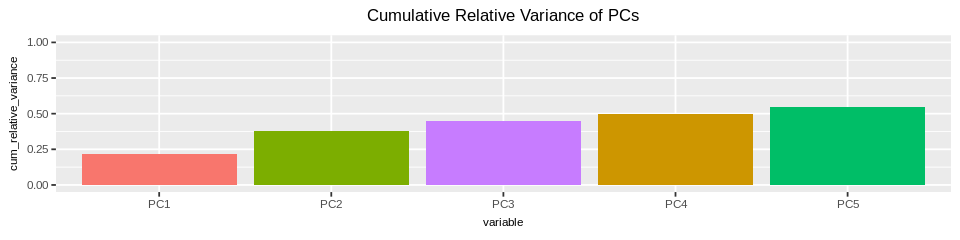

In [52]:
ggplot(df.pc[1:5, ]) + geom_col(aes(x = variable, y = cum_relative_variance, fill = variable)) +
scale_fill_manual(values = PALETTE[2:6]) + ylim(0,1) + theme(legend.position="none") + ggtitle("Cumulative Relative Variance of PCs")

Here, we see that it takes about 10 PCs to capture about 70% of the total variance. Let us see the variables that contribute to the variances in each of the PCs.

In [53]:
pc_vars = pc_constituents(pc)
head(pc_vars, 10)

PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,PC81,PC82,PC83,PC84,PC85,PC86,PC87,PC88,PC89,PC90,PC91,PC92,PC93,PC94,PC95,PC96,PC97,PC98,PC99,PC100,PC101,PC102,PC103,PC104,PC105,PC106,PC107,PC108,PC109,PC110,PC111,PC112,PC113,PC114,PC115,PC116,PC117,PC118,PC119,PC120,PC121,PC122,PC123,PC124,PC125,PC126,PC127,PC128,PC129,PC130,PC131,PC132,PC133,PC134,PC135,PC136,PC137,PC138,PC139,PC140,PC141,PC142,PC143,PC144,PC145,PC146,PC147,PC148,PC149,PC150,PC151,PC152,PC153,PC154,PC155,PC156,PC157,PC158,PC159,PC160,PC161,PC162,PC163,PC164,PC165,PC166,PC167,PC168,PC169,PC170,PC171,PC172,PC173,PC174,PC175,PC176,PC177,PC178,PC179,PC180,PC181,PC182,PC183,PC184,PC185,PC186,PC187,PC188,PC189,PC190,PC191,PC192,PC193,PC194,PC195,PC196,PC197,PC198,PC199,PC200,PC201,PC202,PC203,PC204,PC205,PC206,PC207,PC208,PC209,PC210,PC211,PC212,PC213,PC214,PC215,PC216,PC217,PC218,PC219,PC220,PC221,PC222,PC223,PC224,PC225,PC226,PC227,PC228,PC229,PC230,PC231,PC232,PC233,PC234,PC235,PC236,PC237,PC238,PC239,PC240,PC241,PC242,PC243,PC244,PC245,PC246,PC247,PC248,PC249,PC250,PC251,PC252,PC253,PC254,PC255,PC256,PC257,PC258,PC259,PC260,PC261,PC262,PC263,PC264,PC265,PC266,PC267,PC268,PC269,PC270,PC271,PC272
icaptq.q4,oepf12.q4,gsector.q1,fyr.q1,dilavq.q4,pstknq.q4,ajexq.q3,cogsq.q2,exchg.q3,naics.q4,doy.q2,xidoy.q2,diladq.q2,currtrq.q2,fyearq.q4,updq.q1,xiq.q2,diladq.q4,dvpsxq.q3,srcq.q3,ajexq.q1,fqtr.q2,mibq.q4,pstkrq.q4,fdateq.q2,fdateq.q2,cstkey.q2,cstkey.q2,intanq.q4,stko.q4,fqtr.q3,fyearq.q2,tstkq.q4,prshoq.q4,pnrshoq.q4,apdedateq.q4,gvkey,apdedateq.q4,gvkey,gvkey,pnrshoq.q4,rdq.q2,rdq.q2,tstkq.q4,cstkeq.q4,dvpspq.q2,cstkeq.q2,cstkeq.q2,tstkq.q4,tstkq.q4,txtq.q4,ajpq.q4,dvpsxq.q2,dvpsxq.q1,xiq.q4,intanq.q4,srcq.q4,fdateq.q4,srcq.q2,dlttq.q4,dilady.q2,dlttq.q4,dvpy.q2,dvpspq.q1,cheq.q2,doy.q2,epspi12.q2,updq.q4,dvpspq.q3,oiadpq.q4,srcq.q3,nopiq.q4,rdq.q4,rdq.q4,apdedateq.q2,fdateq.q2,diladq.q4,apdedateq.q2,pstkrq.q4,oiadpq.q4,opepsq.q2,dvpq.q4,dvpq.q2,cogsq.q4,ajpq.q3,cshoq.q2,dvpq.q2,dilady.q4,txtq.q2,updq.q3,updq.q3,updq.q3,updq.q3,prchq.q4,opepsq.q4,txty.q2,aoq.q2,epspxq.q4,piq.q4,txty.q2,ceqq.q2,aoq.q2,saleq.q2,oeps12.q2,oeps12.q2,currtrq.q4,currtrq.q4,cheq.q2,pstknq.q4,ceqq.q4,piq.q4,fyrc.q3,prccq.q2,aoq.q4,aoq.q4,epspxq.q2,ajpq.q4,seqq.q2,ajpq.q4,ajpq.q4,dvpspq.q4,saley.q2,apq.q4,aoq.q2,seqq.q2,oepsxy.q2,prchq.q1,ajpq.q3,ajpq.q3,dvpy.q4,saley.q4,xopry.q2,cogsq.q4,piy.q4,prccq.q3,dilavq.q2,cshoq.q2,oepsxy.q4,epspxq.q2,oepf12.q4,ajpq.q2,ajpq.q2,ajpq.q2,mibq.q2,fqtr.q1,fqtr.q1,mibq.q4,prchq.q2,xopry.q4,prchq.q1,epspxy.q2,cshfdq.q4,xopry.q4,prchq.q3,prchq.q3,prclq.q3,prclq.q3,prclq.q2,prclq.q2,cshfdy.q3,cshfdq.q2,csh12q.q2,dilavy.q4,prccq.q2,cshprq.q4,epsfxq.q2,pstkq.q2,datadate.q1,datadate.q1,csh12q.q4,epsf12.q2,cshfdy.q1,cshfdy.q1,seqq.q2,cshfdy.q4,cshfd12.q1,cshfdy.q3,ibcomq.q2,oepsxq.q2,cshpry.q2,cshpry.q3,cshprq.q1,oepsxq.q4,cshpry.q4,oepsxq.q4,ltmibq.q4,ajpq.q1,cshprq.q1,ltq.q4,oepf12.q2,oepsxy.q4,cshpry.q2,dilavy.q2,oepf12.q4,pstkq.q4,pstknq.q4,csh12q.q4,xiy.q4,opepsy.q2,epspxq.q2,cshfd12.q2,epspiq.q4,epspiq.q4,ltq.q2,ggroup.q4,epsfxy.q2,oepsxy.q4,ibadjy.q4,epsx12.q2,ibadjy.q4,epsfiy.q4,dilavq.q4,gsubind.q1,ibcomq.q4,ibcomy.q4,ibq.q4,datadate.q4,exchg.q1,gind.q1,fqtr.q3,atq.q2,exchg.q1,ajexq.q1,fqtr.q2,fyr.q1,fqtr.q3,lseq.q2,fqtr.q2,ibq.q2,xiy.q2,ibadjq.q2,xiq.q2,xiy.q2,ibadjy.q2,updq.q2,doq.q4,sic.q1,stko.q4,niy.q4,fyearq.q4,doy.q4,gind.q3,gind.q1,naics.q1,stko.q1,stko.q1,sic.q4,exchg.q4,exchg.q4,exchg.q4,gsector.q1,fyrc.q1,fyr.q3,fyr.q4,iby.q2,priusa.q4,priusa.q4,fyr.q3,fyrc.q3,sic.q3,gsector.q3,gsubind.q2,gind.q3,gind.q2,gsubind.q3,naics.q2,fyrc.q3,ggroup.q4,naics.q4,gind.q4,fyrc.q2,fyrc.q4
ceqq.q4,oeps12.q4,gsector.q4,

From the above PC data frame,we see that the first few values of PC1 and PC2 are mostly from quarter 4 of 2016. Ultimately, I want to see which variables are the best at predicting growth, since we have seen from our above analysis that it is very likely that a new company observation falls within a group that experiences growth overall.  

Looking at the principle components, it looks like it takes about the first 11 PCs in order to capture the most variance in the dataset. Let's use another method to see if there are more obvious variables that contribute to the most variation in our dataset.

Let's use the cor() function and observe the correlation between the variables with growth, using the original data frame where we kept only the columns that had less than 90% NA values. Instead now, let's keep all the columns and observe each variable's correlation with growth so that we see all the possibilities

In [54]:
data_subsetted_numeric_all = data_subsetted[sapply(data_subsetted, is.numeric)]

In [55]:
any(is.na(data_subsetted_numeric_all))

[1] TRUE

In [56]:
ncol(data_subsetted_numeric_all)

[1] 705

In [57]:
##Replace the columns full of NAs with the mean of the columns
for(i in 1:ncol(data_subsetted_numeric_all)){
  data_subsetted_numeric_all[is.na(data_subsetted_numeric_all[,i]), i] <- mean(data_subsetted_numeric_all[,i], na.rm = TRUE)
}

In [58]:
any(is.na(data_subsetted_numeric_all))

[1] FALSE

In [59]:
data_subsetted_numeric_all[1:5, ]

,gvkey,datadate.q1,fyearq.q1,fqtr.q1,fyr.q1,ajexq.q1,ajpq.q1,currtrq.q1,scfq.q1,srcq.q1,updq.q1,apdedateq.q1,fdateq.q1,rdq.q1,acomincq.q1,aociotherq.q1,aocisecglq.q1,aoq.q1,apq.q1,atq.q1,ceqq.q1,cheq.q1,cibegniq.q1,cicurrq.q1,ciderglq.q1,cimiiq.q1,ciotherq.q1,cipenq.q1,ciq.q1,cisecglq.q1,citotalq.q1,cogsq.q1,csh12q.q1,cshfd12.q1,cshfdq.q1,cshiq.q1,cshoq.q1,cshprq.q1,cstkeq.q1,cstkq.q1,diladq.q1,dilavq.q1,dlttq.q1,doq.q1,dvpq.q1,epsf12.q1,epsfi12.q1,epsfiq.q1,epsfxq.q1,epspi12.q1,epspiq.q1,epspxq.q1,epsx12.q1,gdwlq.q1,ibadjq.q1,ibcomq.q1,ibmiiq.q1,ibq.q1,icaptq.q1,intanq.q1,invtq.q1,loq.q1,lseq.q1,ltmibq.q1,ltq.q1,mibnq.q1,mibq.q1,mibtq.q1,miiq.q1,niq.q1,nopiq.q1,oepf12.q1,oeps12.q1,oepsxq.q1,oiadpq.q1,opepsq.q1,piq.q1,pnrshoq.q1,ppentq.q1,prshoq.q1,pstknq.q1,pstkq.q1,pstkrq.q1,rectq.q1,req.q1,saleq.q1,seqq.q1,spiq.q1,teqq.q1,tstknq.q1,tstkq.q1,txtq.q1,xidoq.q1,xiq.q1,xoprq.q1,aolochy.q1,capxy.q1,chechy.q1,cibegniy.q1,cicurry.q1,cidergly.q1,cimiiy.q1,ciothery.q1,cipeny.q1,cisecgly.q1,citotaly.q1,ciy.q1,cogsy.q1,cshfdy.q1,cshpry.q1,cstkey.q1,dilady.q1,dilavy.q1,doy.q1,dvpy.q1,dvy.q1,epsfiy.q1,epsfxy.q1,epspiy.q1,epspxy.q1,exrey.q1,fiaoy.q1,fincfy.q1,fopoy.q1,ibadjy.q1,ibcomy.q1,ibcy.q1,ibmiiy.q1,iby.q1,ivacoy.q1,ivncfy.q1,miiy.q1,niy.q1,nopiy.q1,oancfy.q1,oepsxy.q1,oiadpy.q1,opepsy.q1,piy.q1,saley.q1,spiy.q1,sstky.q1,txbcofy.q1,txty.q1,xidocy.q1,xidoy.q1,xiy.q1,xopry.q1,exchg.q1,cik.q1,cshtrq.q1,dvpspq.q1,dvpsxq.q1,mkvaltq.q1,prccq.q1,prchq.q1,prclq.q1,adjex.q1,fyrc.q1,ggroup.q1,gind.q1,gsector.q1,gsubind.q1,naics.q1,priusa.q1,sic.q1,stko.q1,datadate.q2,fyearq.q2,fqtr.q2,fyr.q2,ajexq.q2,ajpq.q2,currtrq.q2,scfq.q2,srcq.q2,updq.q2,apdedateq.q2,fdateq.q2,rdq.q2,acomincq.q2,aociotherq.q2,aocipenq.q2,aocisecglq.q2,aoq.q2,apq.q2,atq.q2,capsq.q2,ceqq.q2,cheq.q2,cibegniq.q2,cicurrq.q2,ciderglq.q2,cimiiq.q2,ciotherq.q2,cipenq.q2,ciq.q2,cisecglq.q2,citotalq.q2,cogsq.q2,csh12q.q2,cshfd12.q2,cshfdq.q2,cshiq.q2,cshoq.q2,cshprq.q2,cstkeq.q2,cstkq.q2,diladq.q2,dilavq.q2,dlcq.q2,dlttq.q2,doq.q2,dvpq.q2,epsf12.q2,epsfi12.q2,epsfiq.q2,epsfxq.q2,epspi12.q2,epspiq.q2,epspxq.q2,epsx12.q2,gdwlq.q2,ibadjq.q2,ibcomq.q2,ibmiiq.q2,ibq.q2,icaptq.q2,intanq.q2,invtq.q2,loq.q2,lseq.q2,ltmibq.q2,ltq.q2,mibnq.q2,mibq.q2,mibtq.q2,miiq.q2,niq.q2,nopiq.q2,oepf12.q2,oeps12.q2,oepsxq.q2,oiadpq.q2,oibdpq.q2,opepsq.q2,piq.q2,pnrshoq.q2,ppentq.q2,prshoq.q2,pstknq.q2,pstkq.q2,pstkrq.q2,rectaq.q2,rectq.q2,req.q2,reunaq.q2,saleq.q2,seqq.q2,spiq.q2,teqq.q2,tstknq.q2,tstkq.q2,txtq.q2,xidoq.q2,xiq.q2,xoprq.q2,aolochy.q2,aqcy.q2,capxy.q2,chechy.q2,cibegniy.q2,cicurry.q2,cidergly.q2,cimiiy.q2,ciothery.q2,cipeny.q2,cisecgly.q2,citotaly.q2,ciy.q2,cogsy.q2,cshfdy.q2,cshpry.q2,cstkey.q2,dilady.q2,dilavy.q2,dltisy.q2,dltry.q2,doy.q2,dvpy.q2,dvy.q2,epsfiy.q2,epsfxy.q2,epspiy.q2,epspxy.q2,exrey.q2,fiaoy.q2,fincfy.q2,fopoxy.q2,fopoy.q2,ibadjy.q2,ibcomy.q2,ibcy.q2,ibmiiy.q2,iby.q2,ivacoy.q2,ivncfy.q2,miiy.q2,niy.q2,nopiy.q2,oancfy.q2,oepsxy.q2,oiadpy.q2,oibdpy.q2,opepsy.q2,piy.q2,prstkcy.q2,saley.q2,sivy.q2,spiy.q2,sstky.q2,txbcofy.q2,txbcoy.q2,txty.q2,xidocy.q2,xidoy.q2,xiy.q2,xopry.q2,exchg.q2,cik.q2,cshtrq.q2,dvpspq.q2,dvpsxq.q2,mkvaltq.q2,prccq.q2,prchq.q2,prclq.q2,adjex.q2,fyrc.q2,ggroup.q2,gind.q2,gsector.q2,gsubind.q2,naics.q2,priusa.q2,sic.q2,stko.q2,datadate.q3,fyearq.q3,fqtr.q3,fyr.q3,ajexq.q3,ajpq.q3,currtrq.q3,scfq.q3,srcq.q3,updq.q3,apdedateq.q3,fdateq.q3,rdq.q3,acomincq.q3,aociotherq.q3,aocisecglq.q3,aoq.q3,apq.q3,atq.q3,ceqq.q3,cheq.q3,cibegniq.q3,cicurrq.q3,ciderglq.q3,cimiiq.q3,ciotherq.q3,cipenq.q3,ciq.q3,cisecglq.q3,citotalq.q3,cogsq.q3,csh12q.q3,cshfd12.q3,cshfdq.q3,cshiq.q3,cshoq.q3,cshprq.q3,cstkeq.q3,cstkq.q3,diladq.q3,dilavq.q3,dlttq.q3,doq.q3,dvpq.q3,epsf12.q3,epsfi12.q3,epsfiq.q3,epsfxq.q3,epspi12.q3,epspiq.q3,epspxq.q3,epsx12.q3,ibadjq.q3,ibcomq.q3,ibmiiq.q3,ibq.q3,icaptq.q3,intanq.q3,invtq.q3,loq.q3,lseq.q3,ltmibq.q3,ltq.q3,mibnq.q3,mibq.q3,mibtq.q3,miiq.q3,niq.q3,nopiq.q3,oepf12.q3,oeps12.q3,oepsxq.q3,oiadpq.q3,opepsq.q3,piq.q3,pnrshoq.q3,ppentq.q3,prshoq.

In [60]:
ncol(data_subsetted_numeric_all)

[1] 705

In [61]:
corplot = as.data.frame((cor(data_subsetted_numeric_all)))
corplot_last_2 = corplot[, c(ncol(corplot) - 1, ncol(corplot))]

In [62]:
corplot[1:5, ]

,gvkey,datadate.q1,fyearq.q1,fqtr.q1,fyr.q1,ajexq.q1,ajpq.q1,currtrq.q1,scfq.q1,srcq.q1,updq.q1,apdedateq.q1,fdateq.q1,rdq.q1,acomincq.q1,aociotherq.q1,aocisecglq.q1,aoq.q1,apq.q1,atq.q1,ceqq.q1,cheq.q1,cibegniq.q1,cicurrq.q1,ciderglq.q1,cimiiq.q1,ciotherq.q1,cipenq.q1,ciq.q1,cisecglq.q1,citotalq.q1,cogsq.q1,csh12q.q1,cshfd12.q1,cshfdq.q1,cshiq.q1,cshoq.q1,cshprq.q1,cstkeq.q1,cstkq.q1,diladq.q1,dilavq.q1,dlttq.q1,doq.q1,dvpq.q1,epsf12.q1,epsfi12.q1,epsfiq.q1,epsfxq.q1,epspi12.q1,epspiq.q1,epspxq.q1,epsx12.q1,gdwlq.q1,ibadjq.q1,ibcomq.q1,ibmiiq.q1,ibq.q1,icaptq.q1,intanq.q1,invtq.q1,loq.q1,lseq.q1,ltmibq.q1,ltq.q1,mibnq.q1,mibq.q1,mibtq.q1,miiq.q1,niq.q1,nopiq.q1,oepf12.q1,oeps12.q1,oepsxq.q1,oiadpq.q1,opepsq.q1,piq.q1,pnrshoq.q1,ppentq.q1,prshoq.q1,pstknq.q1,pstkq.q1,pstkrq.q1,rectq.q1,req.q1,saleq.q1,seqq.q1,spiq.q1,teqq.q1,tstknq.q1,tstkq.q1,txtq.q1,xidoq.q1,xiq.q1,xoprq.q1,aolochy.q1,capxy.q1,chechy.q1,cibegniy.q1,cicurry.q1,cidergly.q1,cimiiy.q1,ciothery.q1,cipeny.q1,cisecgly.q1,citotaly.q1,ciy.q1,cogsy.q1,cshfdy.q1,cshpry.q1,cstkey.q1,dilady.q1,dilavy.q1,doy.q1,dvpy.q1,dvy.q1,epsfiy.q1,epsfxy.q1,epspiy.q1,epspxy.q1,exrey.q1,fiaoy.q1,fincfy.q1,fopoy.q1,ibadjy.q1,ibcomy.q1,ibcy.q1,ibmiiy.q1,iby.q1,ivacoy.q1,ivncfy.q1,miiy.q1,niy.q1,nopiy.q1,oancfy.q1,oepsxy.q1,oiadpy.q1,opepsy.q1,piy.q1,saley.q1,spiy.q1,sstky.q1,txbcofy.q1,txty.q1,xidocy.q1,xidoy.q1,xiy.q1,xopry.q1,exchg.q1,cik.q1,cshtrq.q1,dvpspq.q1,dvpsxq.q1,mkvaltq.q1,prccq.q1,prchq.q1,prclq.q1,adjex.q1,fyrc.q1,ggroup.q1,gind.q1,gsector.q1,gsubind.q1,naics.q1,priusa.q1,sic.q1,stko.q1,datadate.q2,fyearq.q2,fqtr.q2,fyr.q2,ajexq.q2,ajpq.q2,currtrq.q2,scfq.q2,srcq.q2,updq.q2,apdedateq.q2,fdateq.q2,rdq.q2,acomincq.q2,aociotherq.q2,aocipenq.q2,aocisecglq.q2,aoq.q2,apq.q2,atq.q2,capsq.q2,ceqq.q2,cheq.q2,cibegniq.q2,cicurrq.q2,ciderglq.q2,cimiiq.q2,ciotherq.q2,cipenq.q2,ciq.q2,cisecglq.q2,citotalq.q2,cogsq.q2,csh12q.q2,cshfd12.q2,cshfdq.q2,cshiq.q2,cshoq.q2,cshprq.q2,cstkeq.q2,cstkq.q2,diladq.q2,dilavq.q2,dlcq.q2,dlttq.q2,doq.q2,dvpq.q2,epsf12.q2,epsfi12.q2,epsfiq.q2,epsfxq.q2,epspi12.q2,epspiq.q2,epspxq.q2,epsx12.q2,gdwlq.q2,ibadjq.q2,ibcomq.q2,ibmiiq.q2,ibq.q2,icaptq.q2,intanq.q2,invtq.q2,loq.q2,lseq.q2,ltmibq.q2,ltq.q2,mibnq.q2,mibq.q2,mibtq.q2,miiq.q2,niq.q2,nopiq.q2,oepf12.q2,oeps12.q2,oepsxq.q2,oiadpq.q2,oibdpq.q2,opepsq.q2,piq.q2,pnrshoq.q2,ppentq.q2,prshoq.q2,pstknq.q2,pstkq.q2,pstkrq.q2,rectaq.q2,rectq.q2,req.q2,reunaq.q2,saleq.q2,seqq.q2,spiq.q2,teqq.q2,tstknq.q2,tstkq.q2,txtq.q2,xidoq.q2,xiq.q2,xoprq.q2,aolochy.q2,aqcy.q2,capxy.q2,chechy.q2,cibegniy.q2,cicurry.q2,cidergly.q2,cimiiy.q2,ciothery.q2,cipeny.q2,cisecgly.q2,citotaly.q2,ciy.q2,cogsy.q2,cshfdy.q2,cshpry.q2,cstkey.q2,dilady.q2,dilavy.q2,dltisy.q2,dltry.q2,doy.q2,dvpy.q2,dvy.q2,epsfiy.q2,epsfxy.q2,epspiy.q2,epspxy.q2,exrey.q2,fiaoy.q2,fincfy.q2,fopoxy.q2,fopoy.q2,ibadjy.q2,ibcomy.q2,ibcy.q2,ibmiiy.q2,iby.q2,ivacoy.q2,ivncfy.q2,miiy.q2,niy.q2,nopiy.q2,oancfy.q2,oepsxy.q2,oiadpy.q2,oibdpy.q2,opepsy.q2,piy.q2,prstkcy.q2,saley.q2,sivy.q2,spiy.q2,sstky.q2,txbcofy.q2,txbcoy.q2,txty.q2,xidocy.q2,xidoy.q2,xiy.q2,xopry.q2,exchg.q2,cik.q2,cshtrq.q2,dvpspq.q2,dvpsxq.q2,mkvaltq.q2,prccq.q2,prchq.q2,prclq.q2,adjex.q2,fyrc.q2,ggroup.q2,gind.q2,gsector.q2,gsubind.q2,naics.q2,priusa.q2,sic.q2,stko.q2,datadate.q3,fyearq.q3,fqtr.q3,fyr.q3,ajexq.q3,ajpq.q3,currtrq.q3,scfq.q3,srcq.q3,updq.q3,apdedateq.q3,fdateq.q3,rdq.q3,acomincq.q3,aociotherq.q3,aocisecglq.q3,aoq.q3,apq.q3,atq.q3,ceqq.q3,cheq.q3,cibegniq.q3,cicurrq.q3,ciderglq.q3,cimiiq.q3,ciotherq.q3,cipenq.q3,ciq.q3,cisecglq.q3,citotalq.q3,cogsq.q3,csh12q.q3,cshfd12.q3,cshfdq.q3,cshiq.q3,cshoq.q3,cshprq.q3,cstkeq.q3,cstkq.q3,diladq.q3,dilavq.q3,dlttq.q3,doq.q3,dvpq.q3,epsf12.q3,epsfi12.q3,epsfiq.q3,epsfxq.q3,epspi12.q3,epspiq.q3,epspxq.q3,epsx12.q3,ibadjq.q3,ibcomq.q3,ibmiiq.q3,ibq.q3,icaptq.q3,intanq.q3,invtq.q3,loq.q3,lseq.q3,ltmibq.q3,ltq.q3,mibnq.q3,mibq.q3,mibtq.q3,miiq.q3,niq.q3,nopiq.q3,oepf12.q3,oeps12.q3,oepsxq.q3,oiadpq.q3,opepsq.q3,piq.q3,pnrshoq.q3,ppentq.q3,prshoq.

In [63]:
library(dplyr)
growth_desc = corplot_last_2 %>%
    arrange(desc(growth)) %>%
    slice(1:30) 


Attaching package: ‘dplyr’

The following object is masked from ‘package:neuralnet’:

    compute

The following object is masked from ‘package:gridExtra’:

    combine

The following object is masked from ‘package:GGally’:

    nasa

The following objects are masked from ‘package:plyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Note: I got the last 2 columns so that I can see the growth column as a data frame.

**positive correlation**

In [65]:
growth_desc[1:5, ]

stko.q4,growth
0.02326418,1.000000
0.03474760,0.123607
0.03474760,0.123607
0.03474760,0.123607
0.03474760,0.123607


In [66]:
corplot_last_2[corplot_last_2$growth > 0.09, ]

,stko.q4,growth
ggroup.q1,0.03475092,0.1236065
gind.q1,0.03474760,0.1236070
gsector.q1,0.03528520,0.1233788
gsubind.q1,0.03474752,0.1236069
NA,NA,NA
ggroup.q2,0.03475092,0.1236065
gind.q2,0.03474760,0.1236070
gsector.q2,0.03528520,0.1233788
gsubind.q2,0.03474752,0.1236069
NA.1,NA,NA


**negative correlation**

In [67]:
corplot_last_2 %>%
    arrange(growth) %>%
    slice(1:20) 

stko.q4,growth
0.069393843,-0.07005279
0.069393843,-0.07005279
0.083674118,-0.06300194
0.083674118,-0.06300194
0.084276047,-0.06270508
0.070077769,-0.06106653
0.082187430,-0.06066505
0.083248300,-0.06057835
0.083248300,-0.06057835
-0.089947399,-0.05201339


In [68]:
corplot_last_2[corplot_last_2$growth < -0.07, ]

,stko.q4,growth
NA,NA,NA
NA.1,NA,NA
ajexq.q4,0.06939384,-0.07005279
NA.2,NA,NA
adjex.q4,0.06939384,-0.07005279


From the above correlation analysis, the variables that have a positive correlation with growth have a higher absolute value than the variables with negative correlation.

The variables that have the highest negative correlation barely have any correlation with growth at all (ie. <0.10). They will not be included.

However, the correlation between the highest correlated positive variables and growth are not so high either (they are only about .12 at the highest)

Let's get the variable names of the ten most correlated with growth for the purposes of my attempt at finding highly correlated variables anyway.

In [70]:
corplot_last_2 = corplot_last_2[order(corplot_last_2$growth, decreasing = TRUE),]

In [72]:
top_10 = rownames(corplot_last_2)[1:11]

In [73]:
c(top_10)

[1] "growth"     "gind.q1"    "gind.q2"    "gind.q3"    "gind.q4"   
 [6] "gsubind.q1" "gsubind.q2" "gsubind.q3" "gsubind.q4" "ggroup.q1" 
[11] "ggroup.q2"

In [74]:
# Let's see a corrplot of these variables with growth.
install.packages("corrplot")

Updating HTML index of packages in '.Library'
Making 'packages.html' ... done


corrplot 0.84 loaded


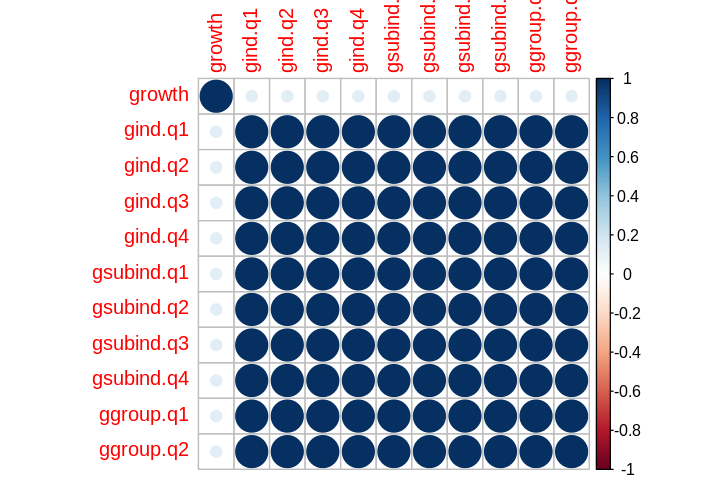

In [75]:
library(corrplot)
library(repr)
options(repr.plot.width=6, repr.plot.height=4)
corrplot(cor(data_subsetted_numeric_all[, c(top_10)]))

Looking at the above correlation plot, it does not look like the top correlated variables with growth have a high correlation with it (the colors are on the low end of the scale at roughly 0.10).

Therefore, in order to choose variables that are meaninful for clustering, I will choose the first 5 variables from PC1 - PC11 (since the cumulative variance from PC1 - PC11 make up 71% of the total variance of the data, which is good enough in terms of accumulating the majority of the variability of the data.)

Let's use these PC variables in clustering to see if there are any meaningful clusters in our data.

In [76]:
pc_vars[1:5,1:11]

PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
icaptq.q4,oepf12.q4,gsector.q1,fyr.q1,dilavq.q4,pstknq.q4,ajexq.q3,cogsq.q2,exchg.q3,naics.q4,doy.q2
ceqq.q4,oeps12.q4,gsector.q4,fyr.q2,ibadjq.q4,pstknq.q2,adjex.q3,cogsy.q4,exchg.q2,naics.q3,xidoy.q2
ceqq.q2,oepsxy.q4,gsector.q3,fyr.q4,ibcomq.q4,pstkq.q4,ajpq.q3,cogsq.q4,exchg.q1,naics.q2,xidoq.q2
seqq.q4,opepsy.q4,gsector.q2,fyr.q3,ibq.q4,pstkq.q2,ajexq.q2,xoprq.q2,exchg.q4,naics.q1,doq.q2
teqq.q4,epsf12.q4,ggroup.q4,fyrc.q1,niq.q4,dvpq.q4,adjex.q2,xopry.q4,stko.q4,sic.q1,epspiq.q4


In [77]:
pc_vars1 = as.vector(pc_vars[1:5, 1])
pc_vars2 = as.vector(pc_vars[1:5, 2])
pc_vars3 = as.vector(pc_vars[1:5, 3])
pc_vars4 = as.vector(pc_vars[1:5, 4])
pc_vars5 = as.vector(pc_vars[1:5, 5])
pc_vars6 = as.vector(pc_vars[1:5, 6])
pc_vars7 = as.vector(pc_vars[1:5, 7])
pc_vars8 = as.vector(pc_vars[1:5, 8])
pc_vars9 = as.vector(pc_vars[1:5, 9])
pc_vars10 = as.vector(pc_vars[1:5,10])
pc_vars11 = as.vector(pc_vars[1:5, 11])
clustering_vars = c(pc_vars1, pc_vars2, pc_vars3, pc_vars4, pc_vars5, pc_vars6, pc_vars7, pc_vars8, pc_vars9, pc_vars10, pc_vars11)
clustering_vars
length(clustering_vars)

[1] "icaptq.q4"  "ceqq.q4"    "ceqq.q2"    "seqq.q4"    "teqq.q4"   
 [6] "oepf12.q4"  "oeps12.q4"  "oepsxy.q4"  "opepsy.q4"  "epsf12.q4" 
[11] "gsector.q1" "gsector.q4" "gsector.q3" "gsector.q2" "ggroup.q4" 
[16] "fyr.q1"     "fyr.q2"     "fyr.q4"     "fyr.q3"     "fyrc.q1"   
[21] "dilavq.q4"  "ibadjq.q4"  "ibcomq.q4"  "ibq.q4"     "niq.q4"    
[26] "pstknq.q4"  "pstknq.q2"  "pstkq.q4"   "pstkq.q2"   "dvpq.q4"   
[31] "ajexq.q3"   "adjex.q3"   "ajpq.q3"    "ajexq.q2"   "adjex.q2"  
[36] "cogsq.q2"   "cogsy.q4"   "cogsq.q4"   "xoprq.q2"   "xopry.q4"  
[41] "exchg.q3"   "exchg.q2"   "exchg.q1"   "exchg.q4"   "stko.q4"   
[46] "naics.q4"   "naics.q3"   "naics.q2"   "naics.q1"   "sic.q1"    
[51] "doy.q2"     "xidoy.q2"   "xidoq.q2"   "doq.q2"     "epspiq.q4"

[1] 55

## Cluster Model

In [78]:
any(is.na(data_subsetted_numeric_all))

[1] FALSE

In [79]:
dim(data_subsetted_numeric_all)

[1] 3000  705

**Organize data into 3 clusters, based on the most positively and negatiely correlated variables with growth. I will use three methods: GMM, K-means, and Hierarchical agglomeration with complete linkage**

**GMM**

In [80]:
any(is.na(data_subsetted_numeric_all))

[1] FALSE

In [81]:
# data_subsetted_numeric_all_gmm = data_subsetted_numeric_all[, c(clustering_vars, "growth")]
data_subsetted_numeric_all_gmm = data_subsetted_numeric_all[, c(clustering_vars)]

In [82]:
# data_subsetted_numeric_all_gmm_norm = scale(data_subsetted_numeric_all_gmm[,c(clustering_vars,"growth")])
data_subsetted_numeric_all_gmm_norm = scale(data_subsetted_numeric_all_gmm[,c(clustering_vars)])
data_subsetted_numeric_all_gmm_norm[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4
552,-0.1532058,-0.1505125,-0.1573606,-0.1491561,-0.1579521,0.6191056,0.6256789,0.6311700,0.6381881,0.5459442,-1.3952413,-1.3952413,-1.3952413,-1.3952413,-1.4015191,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,0.008519663,0.008420145,0.005863218,0.004877907,0.001473049,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,18.88923447,18.88923447,18.90688103,18.5985379,18.5985379,-0.1020346,-0.05860673,-0.08564712,-0.1108712,-0.0626146,1.9710761,1.9710761,1.9710761,1.9710761,-0.3053624,-2.5463982,-2.5463982,-2.5463982,-2.5463982,-1.145454,0.009150363,0.009380359,0.0164933,0.01650047,0.3651006
2997,-0.2488352,-0.2503183,-0.2477707,-0.2458087,-0.2512049,-0.2670226,-0.2685227,-0.2559323,-0.2571238,-0.2561046,-1.7710003,-1.7710003,-1.7710003,-1.7710003,-1.7776090,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.201915595,-0.202044856,-0.203392301,-0.204284092,-0.200569047,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2486012,-0.24610098,-0.24343237,-0.2742949,-0.2697673,-0.8994231,-0.8994231,-0.8994231,-0.8994231,-0.3053624,-1.2441670,-1.2441670,-1.2441670,-1.2441670,-1.800561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1380937
1182,-0.2673199,-0.2687635,-0.2634209,-0.2636712,-0.2684391,-0.3823131,-0.3835584,-0.3713495,-0.3723023,-0.3750786,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.178884072,-0.179010078,-0.180489897,-0.181391924,-0.178456131,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2596258,-0.26214496,-0.25764145,-0.2822505,-0.2819417,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474183,-0.5474183,-0.5474183,-0.5474183,-1.061584,0.009150363,0.009380359,0.0164933,0.01650047,-0.1894709
1386,-0.2637012,-0.2562143,-0.2574092,-0.2515185,-0.2567139,-0.3233272,-0.3247030,-0.3122988,-0.3133738,-0.3135403,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.194389762,-0.194517959,-0.195908659,-0.196803795,-0.193343380,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2597870,-0.26226767,-0.25769424,-0.2813463,-0.2806824,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474059,-0.5474059,-0.5474059,-0.5474059,-1.060561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1577379
717,-0.2639955,-0.2600977,-0.2538679,-0.2552792,-0.2581471,-0.1255906,-0.1274034,-0.1143448,-0.1158293,-0.1350793,-0.2679645,-0.2679645,-0.2679645,-0.2679645,-0.2657278,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.144891792,-0.145012993,-0.146688184,-0.147605318,-0.153012223,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2572422,-0.26069752,-0.25678205,-0.2848523,-0.2867085,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.6310654,-0.6310654,-0.6310654,-0.6310654,-1.444113,0.009150363,0.009380359,0.0164933,0.01650047,-0.2287593


In [83]:
any(is.na(data_subsetted_numeric_all_gmm_norm))
is.data.frame(data_subsetted_numeric_all_gmm_norm[1:5, ])

[1] FALSE

[1] FALSE

In [84]:
data_subsetted_numeric_all_gmm_norm = as.data.frame(data_subsetted_numeric_all_gmm_norm)

In [85]:
is.data.frame(data_subsetted_numeric_all_gmm_norm)

[1] TRUE

In [86]:
data_subsetted_numeric_all_gmm_norm[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4
552,-0.1532058,-0.1505125,-0.1573606,-0.1491561,-0.1579521,0.6191056,0.6256789,0.6311700,0.6381881,0.5459442,-1.3952413,-1.3952413,-1.3952413,-1.3952413,-1.4015191,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,0.008519663,0.008420145,0.005863218,0.004877907,0.001473049,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,18.88923447,18.88923447,18.90688103,18.5985379,18.5985379,-0.1020346,-0.05860673,-0.08564712,-0.1108712,-0.0626146,1.9710761,1.9710761,1.9710761,1.9710761,-0.3053624,-2.5463982,-2.5463982,-2.5463982,-2.5463982,-1.145454,0.009150363,0.009380359,0.0164933,0.01650047,0.3651006
2997,-0.2488352,-0.2503183,-0.2477707,-0.2458087,-0.2512049,-0.2670226,-0.2685227,-0.2559323,-0.2571238,-0.2561046,-1.7710003,-1.7710003,-1.7710003,-1.7710003,-1.7776090,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.201915595,-0.202044856,-0.203392301,-0.204284092,-0.200569047,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2486012,-0.24610098,-0.24343237,-0.2742949,-0.2697673,-0.8994231,-0.8994231,-0.8994231,-0.8994231,-0.3053624,-1.2441670,-1.2441670,-1.2441670,-1.2441670,-1.800561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1380937
1182,-0.2673199,-0.2687635,-0.2634209,-0.2636712,-0.2684391,-0.3823131,-0.3835584,-0.3713495,-0.3723023,-0.3750786,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.178884072,-0.179010078,-0.180489897,-0.181391924,-0.178456131,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2596258,-0.26214496,-0.25764145,-0.2822505,-0.2819417,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474183,-0.5474183,-0.5474183,-0.5474183,-1.061584,0.009150363,0.009380359,0.0164933,0.01650047,-0.1894709
1386,-0.2637012,-0.2562143,-0.2574092,-0.2515185,-0.2567139,-0.3233272,-0.3247030,-0.3122988,-0.3133738,-0.3135403,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.194389762,-0.194517959,-0.195908659,-0.196803795,-0.193343380,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2597870,-0.26226767,-0.25769424,-0.2813463,-0.2806824,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474059,-0.5474059,-0.5474059,-0.5474059,-1.060561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1577379
717,-0.2639955,-0.2600977,-0.2538679,-0.2552792,-0.2581471,-0.1255906,-0.1274034,-0.1143448,-0.1158293,-0.1350793,-0.2679645,-0.2679645,-0.2679645,-0.2679645,-0.2657278,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.144891792,-0.145012993,-0.146688184,-0.147605318,-0.153012223,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2572422,-0.26069752,-0.25678205,-0.2848523,-0.2867085,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.6310654,-0.6310654,-0.6310654,-0.6310654,-1.444113,0.009150363,0.009380359,0.0164933,0.01650047,-0.2287593


In [87]:
set.seed(12345)
model = Mclust(data_subsetted_numeric_all_gmm_norm, G=3) # Highest correlated variables.
data_subsetted_numeric_all_gmm_norm$cluster = model$classification

# options(repr.plot.width=8, repr.plot.height=1)
# ggplot(data_subsetted_numeric_all_gmm_norm) + geom_point(aes(x=growth, y=0, color=factor(class))) + scale_color_manual(values=PALETTE)
# options(restore)

In [88]:
data_subsetted_numeric_all_gmm_norm[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,cluster
552,-0.1532058,-0.1505125,-0.1573606,-0.1491561,-0.1579521,0.6191056,0.6256789,0.6311700,0.6381881,0.5459442,-1.3952413,-1.3952413,-1.3952413,-1.3952413,-1.4015191,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,0.008519663,0.008420145,0.005863218,0.004877907,0.001473049,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,18.88923447,18.88923447,18.90688103,18.5985379,18.5985379,-0.1020346,-0.05860673,-0.08564712,-0.1108712,-0.0626146,1.9710761,1.9710761,1.9710761,1.9710761,-0.3053624,-2.5463982,-2.5463982,-2.5463982,-2.5463982,-1.145454,0.009150363,0.009380359,0.0164933,0.01650047,0.3651006,3
2997,-0.2488352,-0.2503183,-0.2477707,-0.2458087,-0.2512049,-0.2670226,-0.2685227,-0.2559323,-0.2571238,-0.2561046,-1.7710003,-1.7710003,-1.7710003,-1.7710003,-1.7776090,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.201915595,-0.202044856,-0.203392301,-0.204284092,-0.200569047,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2486012,-0.24610098,-0.24343237,-0.2742949,-0.2697673,-0.8994231,-0.8994231,-0.8994231,-0.8994231,-0.3053624,-1.2441670,-1.2441670,-1.2441670,-1.2441670,-1.800561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1380937,2
1182,-0.2673199,-0.2687635,-0.2634209,-0.2636712,-0.2684391,-0.3823131,-0.3835584,-0.3713495,-0.3723023,-0.3750786,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.178884072,-0.179010078,-0.180489897,-0.181391924,-0.178456131,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2596258,-0.26214496,-0.25764145,-0.2822505,-0.2819417,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474183,-0.5474183,-0.5474183,-0.5474183,-1.061584,0.009150363,0.009380359,0.0164933,0.01650047,-0.1894709,2
1386,-0.2637012,-0.2562143,-0.2574092,-0.2515185,-0.2567139,-0.3233272,-0.3247030,-0.3122988,-0.3133738,-0.3135403,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.194389762,-0.194517959,-0.195908659,-0.196803795,-0.193343380,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2597870,-0.26226767,-0.25769424,-0.2813463,-0.2806824,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474059,-0.5474059,-0.5474059,-0.5474059,-1.060561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1577379,2
717,-0.2639955,-0.2600977,-0.2538679,-0.2552792,-0.2581471,-0.1255906,-0.1274034,-0.1143448,-0.1158293,-0.1350793,-0.2679645,-0.2679645,-0.2679645,-0.2679645,-0.2657278,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.144891792,-0.145012993,-0.146688184,-0.147605318,-0.153012223,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2572422,-0.26069752,-0.25678205,-0.2848523,-0.2867085,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.6310654,-0.6310654,-0.6310654,-0.6310654,-1.444113,0.009150363,0.009380359,0.0164933,0.01650047,-0.2287593,2


Let's add the class cluster variable to the original data frame that was not normalized

In [89]:
data_subsetted_numeric_all_gmm$cluster = data_subsetted_numeric_all_gmm_norm$cluster

In [90]:
data_subsetted_numeric_all_gmm[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,cluster
552,3372.280,1775.200,1640.943,1775.200,1775.200,11.26,11.41,11.26,11.41,9.77,15,15,15,15,1510,12,12,12,12,12,98.331,98.331,98.331,98.331,98.331,0,0,0,0,0,5,5,5,5,5,613.690,2569.261,681.065,766.083,3182.086,19,19,19,19,0,3222,3222,3222,3222,2670,0,0,0,0,2.80,3
2997,620.871,281.398,285.146,281.398,281.398,-1.96,-1.96,-1.96,-1.96,-1.96,10,10,10,10,1010,12,12,12,12,12,-36.081,-36.081,-36.081,-36.081,-36.081,0,0,0,0,0,1,1,1,1,1,43.515,203.949,56.457,58.885,265.289,11,11,11,11,0,213112,213112,213112,213112,1389,0,0,0,0,-0.53,2
1182,89.037,5.326,50.454,5.326,5.326,-3.68,-3.68,-3.68,-3.68,-3.70,35,35,35,35,3520,12,12,12,12,12,-21.370,-21.370,-21.370,-21.370,-21.370,0,0,0,0,0,1,1,1,1,1,0.627,1.548,0.209,24.458,93.869,14,14,14,14,0,325412,325412,325412,325412,2834,0,0,0,0,-0.87,2
1386,193.151,193.151,140.605,193.151,193.151,-2.80,-2.80,-2.80,-2.80,-2.80,35,35,35,35,3520,12,12,12,12,12,-31.274,-31.274,-31.274,-31.274,-31.274,0,0,0,0,0,1,1,1,1,1,0.000,0.000,0.000,28.371,111.600,14,14,14,14,0,325414,325414,325414,325414,2836,0,0,0,0,-0.66,2
717,184.686,135.028,193.711,135.028,170.192,0.15,0.15,0.15,0.15,-0.19,30,30,30,30,3020,12,12,12,12,12,0.342,0.342,0.342,0.342,-4.443,0,0,0,0,0,1,1,1,1,1,9.900,19.808,3.611,13.199,26.750,14,14,14,14,0,311930,311930,311930,311930,2086,0,0,0,0,-1.13,2


**Hierarchical agglomeration**

In [101]:
# data_subsetted_numeric_all_hier = data_subsetted_numeric_all[, c(clustering_vars,"growth")]
data_subsetted_numeric_all_hier = data_subsetted_numeric_all[, c(clustering_vars)]

In [102]:
# data_subsetted_numeric_all_hier_norm = scale(data_subsetted_numeric_all_hier[,c(clustering_vars, "growth")])
data_subsetted_numeric_all_hier_norm = scale(data_subsetted_numeric_all_hier[,c(clustering_vars)])
data_subsetted_numeric_all_hier_norm[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4
552,-0.1532058,-0.1505125,-0.1573606,-0.1491561,-0.1579521,0.6191056,0.6256789,0.6311700,0.6381881,0.5459442,-1.3952413,-1.3952413,-1.3952413,-1.3952413,-1.4015191,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,0.008519663,0.008420145,0.005863218,0.004877907,0.001473049,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,18.88923447,18.88923447,18.90688103,18.5985379,18.5985379,-0.1020346,-0.05860673,-0.08564712,-0.1108712,-0.0626146,1.9710761,1.9710761,1.9710761,1.9710761,-0.3053624,-2.5463982,-2.5463982,-2.5463982,-2.5463982,-1.145454,0.009150363,0.009380359,0.0164933,0.01650047,0.3651006
2997,-0.2488352,-0.2503183,-0.2477707,-0.2458087,-0.2512049,-0.2670226,-0.2685227,-0.2559323,-0.2571238,-0.2561046,-1.7710003,-1.7710003,-1.7710003,-1.7710003,-1.7776090,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.201915595,-0.202044856,-0.203392301,-0.204284092,-0.200569047,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2486012,-0.24610098,-0.24343237,-0.2742949,-0.2697673,-0.8994231,-0.8994231,-0.8994231,-0.8994231,-0.3053624,-1.2441670,-1.2441670,-1.2441670,-1.2441670,-1.800561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1380937
1182,-0.2673199,-0.2687635,-0.2634209,-0.2636712,-0.2684391,-0.3823131,-0.3835584,-0.3713495,-0.3723023,-0.3750786,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.178884072,-0.179010078,-0.180489897,-0.181391924,-0.178456131,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2596258,-0.26214496,-0.25764145,-0.2822505,-0.2819417,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474183,-0.5474183,-0.5474183,-0.5474183,-1.061584,0.009150363,0.009380359,0.0164933,0.01650047,-0.1894709
1386,-0.2637012,-0.2562143,-0.2574092,-0.2515185,-0.2567139,-0.3233272,-0.3247030,-0.3122988,-0.3133738,-0.3135403,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.194389762,-0.194517959,-0.195908659,-0.196803795,-0.193343380,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2597870,-0.26226767,-0.25769424,-0.2813463,-0.2806824,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474059,-0.5474059,-0.5474059,-0.5474059,-1.060561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1577379
717,-0.2639955,-0.2600977,-0.2538679,-0.2552792,-0.2581471,-0.1255906,-0.1274034,-0.1143448,-0.1158293,-0.1350793,-0.2679645,-0.2679645,-0.2679645,-0.2679645,-0.2657278,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.144891792,-0.145012993,-0.146688184,-0.147605318,-0.153012223,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2572422,-0.26069752,-0.25678205,-0.2848523,-0.2867085,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.6310654,-0.6310654,-0.6310654,-0.6310654,-1.444113,0.009150363,0.009380359,0.0164933,0.01650047,-0.2287593


In [103]:
set.seed(12345)
tree = hclust(dist(data_subsetted_numeric_all_hier_norm), method="complete")

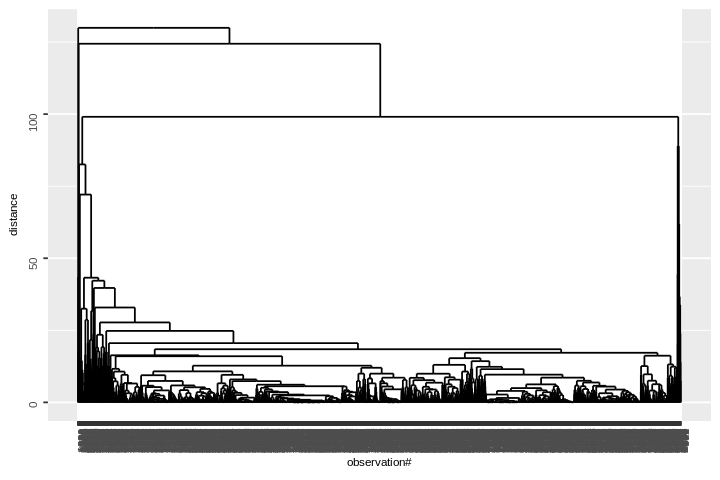

In [104]:
library(ggdendro,  verbose=FALSE, warn.conflicts=FALSE, quietly=TRUE)
ggdendrogram(tree, theme_dendro=FALSE) + xlab("observation#") + ylab("distance")

In [105]:
cluster = as.vector(cutree(tree, k=3))

In [106]:
data_subsetted_numeric_all_hier_norm = cbind(data_subsetted_numeric_all_hier_norm, cluster)

In [107]:
data_subsetted_numeric_all_hier_norm[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,cluster
552,-0.1532058,-0.1505125,-0.1573606,-0.1491561,-0.1579521,0.6191056,0.6256789,0.6311700,0.6381881,0.5459442,-1.3952413,-1.3952413,-1.3952413,-1.3952413,-1.4015191,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,0.008519663,0.008420145,0.005863218,0.004877907,0.001473049,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,18.88923447,18.88923447,18.90688103,18.5985379,18.5985379,-0.1020346,-0.05860673,-0.08564712,-0.1108712,-0.0626146,1.9710761,1.9710761,1.9710761,1.9710761,-0.3053624,-2.5463982,-2.5463982,-2.5463982,-2.5463982,-1.145454,0.009150363,0.009380359,0.0164933,0.01650047,0.3651006,1
2997,-0.2488352,-0.2503183,-0.2477707,-0.2458087,-0.2512049,-0.2670226,-0.2685227,-0.2559323,-0.2571238,-0.2561046,-1.7710003,-1.7710003,-1.7710003,-1.7710003,-1.7776090,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.201915595,-0.202044856,-0.203392301,-0.204284092,-0.200569047,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2486012,-0.24610098,-0.24343237,-0.2742949,-0.2697673,-0.8994231,-0.8994231,-0.8994231,-0.8994231,-0.3053624,-1.2441670,-1.2441670,-1.2441670,-1.2441670,-1.800561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1380937,1
1182,-0.2673199,-0.2687635,-0.2634209,-0.2636712,-0.2684391,-0.3823131,-0.3835584,-0.3713495,-0.3723023,-0.3750786,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.178884072,-0.179010078,-0.180489897,-0.181391924,-0.178456131,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2596258,-0.26214496,-0.25764145,-0.2822505,-0.2819417,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474183,-0.5474183,-0.5474183,-0.5474183,-1.061584,0.009150363,0.009380359,0.0164933,0.01650047,-0.1894709,1
1386,-0.2637012,-0.2562143,-0.2574092,-0.2515185,-0.2567139,-0.3233272,-0.3247030,-0.3122988,-0.3133738,-0.3135403,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.194389762,-0.194517959,-0.195908659,-0.196803795,-0.193343380,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2597870,-0.26226767,-0.25769424,-0.2813463,-0.2806824,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474059,-0.5474059,-0.5474059,-0.5474059,-1.060561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1577379,1
717,-0.2639955,-0.2600977,-0.2538679,-0.2552792,-0.2581471,-0.1255906,-0.1274034,-0.1143448,-0.1158293,-0.1350793,-0.2679645,-0.2679645,-0.2679645,-0.2679645,-0.2657278,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.144891792,-0.145012993,-0.146688184,-0.147605318,-0.153012223,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2572422,-0.26069752,-0.25678205,-0.2848523,-0.2867085,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.6310654,-0.6310654,-0.6310654,-0.6310654,-1.444113,0.009150363,0.009380359,0.0164933,0.01650047,-0.2287593,1


**K-means**

In [108]:
# data_subsetted_numeric_all_k_means = data_subsetted_numeric_all[, c(clustering_vars, "growth")]
data_subsetted_numeric_all_k_means = data_subsetted_numeric_all[, c(clustering_vars)]
# data_subsetted_numeric_all_k_means_norm = scale(data_subsetted_numeric_all_k_means[,c(clustering_vars,"growth")])
data_subsetted_numeric_all_k_means_norm = scale(data_subsetted_numeric_all_k_means[,c(clustering_vars)])

With set.seed = 1234

In [109]:
number_of_clusters = 3
set.seed(1234)
cluster = kmeans(data_subsetted_numeric_all_k_means_norm, number_of_clusters, nstart=1)$cluster
data_subsetted_numeric_all_k_means_norm = cbind(data_subsetted_numeric_all_k_means_norm, cluster)
data_subsetted_numeric_all_k_means_norm[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,cluster
552,-0.1532058,-0.1505125,-0.1573606,-0.1491561,-0.1579521,0.6191056,0.6256789,0.6311700,0.6381881,0.5459442,-1.3952413,-1.3952413,-1.3952413,-1.3952413,-1.4015191,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,0.008519663,0.008420145,0.005863218,0.004877907,0.001473049,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,18.88923447,18.88923447,18.90688103,18.5985379,18.5985379,-0.1020346,-0.05860673,-0.08564712,-0.1108712,-0.0626146,1.9710761,1.9710761,1.9710761,1.9710761,-0.3053624,-2.5463982,-2.5463982,-2.5463982,-2.5463982,-1.145454,0.009150363,0.009380359,0.0164933,0.01650047,0.3651006,1
2997,-0.2488352,-0.2503183,-0.2477707,-0.2458087,-0.2512049,-0.2670226,-0.2685227,-0.2559323,-0.2571238,-0.2561046,-1.7710003,-1.7710003,-1.7710003,-1.7710003,-1.7776090,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.201915595,-0.202044856,-0.203392301,-0.204284092,-0.200569047,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2486012,-0.24610098,-0.24343237,-0.2742949,-0.2697673,-0.8994231,-0.8994231,-0.8994231,-0.8994231,-0.3053624,-1.2441670,-1.2441670,-1.2441670,-1.2441670,-1.800561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1380937,1
1182,-0.2673199,-0.2687635,-0.2634209,-0.2636712,-0.2684391,-0.3823131,-0.3835584,-0.3713495,-0.3723023,-0.3750786,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.178884072,-0.179010078,-0.180489897,-0.181391924,-0.178456131,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2596258,-0.26214496,-0.25764145,-0.2822505,-0.2819417,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474183,-0.5474183,-0.5474183,-0.5474183,-1.061584,0.009150363,0.009380359,0.0164933,0.01650047,-0.1894709,1
1386,-0.2637012,-0.2562143,-0.2574092,-0.2515185,-0.2567139,-0.3233272,-0.3247030,-0.3122988,-0.3133738,-0.3135403,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.194389762,-0.194517959,-0.195908659,-0.196803795,-0.193343380,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2597870,-0.26226767,-0.25769424,-0.2813463,-0.2806824,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474059,-0.5474059,-0.5474059,-0.5474059,-1.060561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1577379,1
717,-0.2639955,-0.2600977,-0.2538679,-0.2552792,-0.2581471,-0.1255906,-0.1274034,-0.1143448,-0.1158293,-0.1350793,-0.2679645,-0.2679645,-0.2679645,-0.2679645,-0.2657278,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.144891792,-0.145012993,-0.146688184,-0.147605318,-0.153012223,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2572422,-0.26069752,-0.25678205,-0.2848523,-0.2867085,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.6310654,-0.6310654,-0.6310654,-0.6310654,-1.444113,0.009150363,0.009380359,0.0164933,0.01650047,-0.2287593,1


With set.seed = 12345

In [110]:
# data_subsetted_numeric_all_k_means2 = data_subsetted_numeric_all[, c(clustering_vars,"growth")]
data_subsetted_numeric_all_k_means2 = data_subsetted_numeric_all[, c(clustering_vars)]
# data_subsetted_numeric_all_k_means_norm2 = scale(data_subsetted_numeric_all_k_means[,c(clustering_vars,"growth")])
data_subsetted_numeric_all_k_means_norm2 = scale(data_subsetted_numeric_all_k_means[,c(clustering_vars)])

In [111]:
number_of_clusters = 3
set.seed(12345)
cluster = kmeans(data_subsetted_numeric_all_k_means_norm2, number_of_clusters, nstart=1)$cluster
data_subsetted_numeric_all_k_means_norm2 = cbind(data_subsetted_numeric_all_k_means_norm2, cluster)
data_subsetted_numeric_all_k_means_norm2[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,cluster
552,-0.1532058,-0.1505125,-0.1573606,-0.1491561,-0.1579521,0.6191056,0.6256789,0.6311700,0.6381881,0.5459442,-1.3952413,-1.3952413,-1.3952413,-1.3952413,-1.4015191,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,0.008519663,0.008420145,0.005863218,0.004877907,0.001473049,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,18.88923447,18.88923447,18.90688103,18.5985379,18.5985379,-0.1020346,-0.05860673,-0.08564712,-0.1108712,-0.0626146,1.9710761,1.9710761,1.9710761,1.9710761,-0.3053624,-2.5463982,-2.5463982,-2.5463982,-2.5463982,-1.145454,0.009150363,0.009380359,0.0164933,0.01650047,0.3651006,1
2997,-0.2488352,-0.2503183,-0.2477707,-0.2458087,-0.2512049,-0.2670226,-0.2685227,-0.2559323,-0.2571238,-0.2561046,-1.7710003,-1.7710003,-1.7710003,-1.7710003,-1.7776090,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.201915595,-0.202044856,-0.203392301,-0.204284092,-0.200569047,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2486012,-0.24610098,-0.24343237,-0.2742949,-0.2697673,-0.8994231,-0.8994231,-0.8994231,-0.8994231,-0.3053624,-1.2441670,-1.2441670,-1.2441670,-1.2441670,-1.800561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1380937,2
1182,-0.2673199,-0.2687635,-0.2634209,-0.2636712,-0.2684391,-0.3823131,-0.3835584,-0.3713495,-0.3723023,-0.3750786,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.178884072,-0.179010078,-0.180489897,-0.181391924,-0.178456131,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2596258,-0.26214496,-0.25764145,-0.2822505,-0.2819417,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474183,-0.5474183,-0.5474183,-0.5474183,-1.061584,0.009150363,0.009380359,0.0164933,0.01650047,-0.1894709,2
1386,-0.2637012,-0.2562143,-0.2574092,-0.2515185,-0.2567139,-0.3233272,-0.3247030,-0.3122988,-0.3133738,-0.3135403,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.194389762,-0.194517959,-0.195908659,-0.196803795,-0.193343380,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2597870,-0.26226767,-0.25769424,-0.2813463,-0.2806824,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474059,-0.5474059,-0.5474059,-0.5474059,-1.060561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1577379,2
717,-0.2639955,-0.2600977,-0.2538679,-0.2552792,-0.2581471,-0.1255906,-0.1274034,-0.1143448,-0.1158293,-0.1350793,-0.2679645,-0.2679645,-0.2679645,-0.2679645,-0.2657278,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.144891792,-0.145012993,-0.146688184,-0.147605318,-0.153012223,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2572422,-0.26069752,-0.25678205,-0.2848523,-0.2867085,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.6310654,-0.6310654,-0.6310654,-0.6310654,-1.444113,0.009150363,0.009380359,0.0164933,0.01650047,-0.2287593,2


### More Cluster Modeling

Develop and evaluate additional models.  Select the best best model.

Now, let us see which clustering model is the best by showing the diffusion ratio (cluster ratio) of each method. The method with the highest cluster ratio (which is the intercluster quality divided by intra cluster quality) is the best at making sure observations in the same cluster are most similar to each other and observations in different clusters are very different from each other.

**Cluster quality of GMM**

In [112]:
data_subsetted_numeric_all_gmm_norm_1 = data_subsetted_numeric_all_gmm_norm[data_subsetted_numeric_all_gmm_norm$cluster == 1, ]
data_subsetted_numeric_all_gmm_norm_2 = data_subsetted_numeric_all_gmm_norm[data_subsetted_numeric_all_gmm_norm$cluster == 2, ]
data_subsetted_numeric_all_gmm_norm_3 = data_subsetted_numeric_all_gmm_norm[data_subsetted_numeric_all_gmm_norm$cluster == 3, ]

In [113]:
summary_GMM = data.frame(intracluster_diffusion=c(mean(dist(data_subsetted_numeric_all_gmm_norm_1)),
                                              mean(dist(data_subsetted_numeric_all_gmm_norm_2)),
                                                 mean(dist(data_subsetted_numeric_all_gmm_norm_3))))
summary_GMM

intracluster_diffusion
7.284213
4.516208
18.680206


In [114]:
mean_intracluster_diffusion_GMM = mean(summary_GMM$intracluster_diffusion)
data.frame(mean_intracluster_diffusion_GMM = mean_intracluster_diffusion_GMM)

mean_intracluster_diffusion_GMM
10.16021


In [115]:
centroid_GMM = cbind(rbind(t(colMeans(data_subsetted_numeric_all_gmm_norm_1)),
                                                   t(colMeans(data_subsetted_numeric_all_gmm_norm_2)),
                          t(colMeans(data_subsetted_numeric_all_gmm_norm_3))))
centroid_GMM

icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,cluster
-0.05762091,-0.06253796,-0.06199874,-0.06404099,-0.06529792,0.006647844,0.007159977,-0.002599252,-0.002495762,0.00295107,0.001157191,0.001157191,0.001157191,0.001157191,0.002042971,-0.57618565,-0.5758461,-0.57501271,-0.57501271,-0.5747036,-0.02445655,-0.0248364,-0.02742054,-0.02786307,-0.02925115,-0.07067735,-0.06904763,-0.0682970,-0.06679897,-0.07060279,-0.08532921,-0.08532921,-0.08439522,-0.08587667,-0.08587667,-0.02639566,-0.02391297,-0.02862966,-0.02374214,-0.02296119,0.11824032,0.11824032,0.11824032,0.11824032,0.3524195,-0.007788509,-0.007788509,-0.007788509,-0.007788509,0.015012019,0.010539595,0.010766561,0.01720368,0.01721076,0.01732685,1
-0.23646696,-0.23425879,-0.23311378,-0.23021738,-0.23468313,-0.081944863,-0.082625318,-0.075147010,-0.075583851,-0.07571160,-0.007333596,-0.007333596,-0.007333596,-0.007333596,-0.007732036,0.39209288,0.3917733,0.39000370,0.39000370,0.3899564,-0.13287117,-0.1331787,-0.13486961,-0.13577465,-0.13445631,-0.08458441,-0.08272501,-0.0885624,-0.08656461,-0.09123546,-0.08552239,-0.08552239,-0.08480341,-0.08606690,-0.08606690,-0.22976678,-0.22728512,-0.22677419,-0.25257054,-0.24738940,-0.06172876,-0.06172876,-0.06172876,-0.06172876,-0.3043722,0.029323484,0.029323484,0.029323484,0.029323484,-0.009731854,0.009173297,0.009403291,0.01653560,0.01654276,-0.03144398,2
1.21332339,1.21906940,1.21237977,1.20612035,1.22956255,0.337147623,0.338516897,0.336399046,0.337983329,0.32149108,0.028412771,0.028412771,0.028412771,0.028412771,0.027380498,0.09087231,0.0912055,0.09632675,0.09632675,0.0955657,0.65697403,0.6595063,0.67498195,0.68032067,0.67890694,0.59072983,0.57750594,0.6006555,0.58723935,0.61955003,0.64069208,0.64069208,0.63462769,0.64478433,0.64478433,1.08631045,1.06769829,1.08023109,1.17761710,1.15253986,-0.10048102,-0.10048102,-0.10048102,-0.10048102,0.2263977,-0.103712493,-0.103712493,-0.103712493,-0.103712493,-0.004480913,-0.073063669,-0.074778824,-0.12608488,-0.12613832,0.08311743,3


In [116]:
mean_intercluster_diffusion_GMM = mean(dist(centroid_GMM))
data.frame(mean_intercluster_diffusion_GMM)

mean_intercluster_diffusion_GMM
4.501552


In [117]:
diffusion_ratio_GMM = mean_intercluster_diffusion_GMM / mean_intracluster_diffusion_GMM
data.frame(diffusion_ratio_GMM)

diffusion_ratio_GMM
0.4430571


**Cluster quality of Hierarchical agglomeration**

In [118]:
is.data.frame(data_subsetted_numeric_all_hier_norm)

[1] FALSE

In [119]:
data_subsetted_numeric_all_hier_norm = as.data.frame(data_subsetted_numeric_all_hier_norm)

In [120]:
data_subsetted_numeric_all_hier_norm_1 = data_subsetted_numeric_all_hier_norm[data_subsetted_numeric_all_hier_norm$cluster == 1, ]
data_subsetted_numeric_all_hier_norm_2 = data_subsetted_numeric_all_hier_norm[data_subsetted_numeric_all_hier_norm$cluster == 2, ]
data_subsetted_numeric_all_hier_norm_3 = data_subsetted_numeric_all_hier_norm[data_subsetted_numeric_all_hier_norm$cluster == 3, ]

In [121]:
data_subsetted_numeric_all_hier_norm_3 ##Just one observation only (interesting)

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,cluster
19,0.1594905,-0.3434982,0.4532038,-0.3360448,-0.1839938,-0.2207723,-0.2223747,-0.2096312,-0.2109185,-0.2102927,1.61083,1.61083,1.61083,1.61083,1.6072,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-5.570767,-5.571655,-5.542145,-5.540651,-6.879985,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,2.044692,2.953841,2.814804,1.783763,2.592871,1.971076,1.971076,1.971076,1.971076,3.286853,-2.552671,-2.552671,-2.552671,-2.552671,2.601591,-45.32322,-45.3195,-49.31677,-49.31677,-0.4055573,3


In [122]:
summary_hier = data.frame(intracluster_diffusion=c(mean(dist(data_subsetted_numeric_all_hier_norm_1)),
                                              mean(dist(data_subsetted_numeric_all_hier_norm_2)),
                                                  mean(dist(data_subsetted_numeric_all_hier_norm_3))))
mean_intracluster_diffusion_hier = mean(summary_hier$intracluster_diffusion)
centroid_hier = cbind(rbind(t(colMeans(data_subsetted_numeric_all_hier_norm_1)),
                                                   t(colMeans(data_subsetted_numeric_all_hier_norm_2)),
                           t(colMeans(data_subsetted_numeric_all_hier_norm_3))))
mean_intercluster_diffusion_hier = mean(dist(centroid_hier))
diffusion_ratio_hier = mean_intercluster_diffusion_hier / mean_intracluster_diffusion_hier
data.frame(diffusion_ratio_hier)

diffusion_ratio_hier
NaN


Since there is only one observation in cluster 3, we expect the diffusion ratio to be NaN since we would be dividing by an intracluster distance of 0.

**Cluster quality of K_means algorithm agglomeration algorithm 1**

In [124]:
is.data.frame(data_subsetted_numeric_all_k_means_norm)

[1] FALSE

In [125]:
data_subsetted_numeric_all_k_means_norm = as.data.frame(data_subsetted_numeric_all_k_means_norm)

In [126]:
data_subsetted_numeric_all_k_means_norm_1 = data_subsetted_numeric_all_k_means_norm[data_subsetted_numeric_all_k_means_norm$cluster == 1, ]
data_subsetted_numeric_all_k_means_norm_2 = data_subsetted_numeric_all_k_means_norm[data_subsetted_numeric_all_k_means_norm$cluster == 2, ]
data_subsetted_numeric_all_k_means_norm_3 = data_subsetted_numeric_all_k_means_norm[data_subsetted_numeric_all_k_means_norm$cluster == 3, ]

summary_k_means = data.frame(intracluster_diffusion=c(mean(dist(data_subsetted_numeric_all_k_means_norm_1)),
                                              mean(dist(data_subsetted_numeric_all_k_means_norm_2)),
                                                     mean(dist(data_subsetted_numeric_all_k_means_norm_3))))
mean_intracluster_diffusion_k_means = mean(summary_k_means$intracluster_diffusion)
centroid_k_means = cbind(rbind(t(colMeans(data_subsetted_numeric_all_k_means_norm_1)),
                                                   t(colMeans(data_subsetted_numeric_all_k_means_norm_2)),
                              t(colMeans(data_subsetted_numeric_all_k_means_norm_3))))

mean_intercluster_diffusion_k_means = mean(dist(centroid_k_means))
diffusion_ratio_k_means = mean_intercluster_diffusion_k_means / mean_intracluster_diffusion_k_means
data.frame(diffusion_ratio_k_means)

diffusion_ratio_k_means
1.059188


**Cluster quality of K_means algorithm agglomeration algorithm 2**

In [127]:
is.data.frame(data_subsetted_numeric_all_k_means_norm2)

[1] FALSE

In [128]:
data_subsetted_numeric_all_k_means_norm2 = as.data.frame(data_subsetted_numeric_all_k_means_norm2)

In [129]:
data_subsetted_numeric_all_k_means_norm2_1 = data_subsetted_numeric_all_k_means_norm2[data_subsetted_numeric_all_k_means_norm2$cluster == 1, ]
data_subsetted_numeric_all_k_means_norm2_2 = data_subsetted_numeric_all_k_means_norm2[data_subsetted_numeric_all_k_means_norm2$cluster == 2, ]
data_subsetted_numeric_all_k_means_norm2_3 = data_subsetted_numeric_all_k_means_norm2[data_subsetted_numeric_all_k_means_norm2$cluster == 3, ]

summary_k_means2 = data.frame(intracluster_diffusion=c(mean(dist(data_subsetted_numeric_all_k_means_norm2_1)),
                                              mean(dist(data_subsetted_numeric_all_k_means_norm2_2)),
                                                      mean(dist(data_subsetted_numeric_all_k_means_norm2_3))))


mean_intracluster_diffusion_k_means2 = mean(summary_k_means2$intracluster_diffusion)
centroid_k_means2 = cbind(rbind(t(colMeans(data_subsetted_numeric_all_k_means_norm2_1)),
                                                   t(colMeans(data_subsetted_numeric_all_k_means_norm2_2)),
                               t(colMeans(data_subsetted_numeric_all_k_means_norm2_3))))

mean_intercluster_diffusion_k_means2 = mean(dist(centroid_k_means2))
diffusion_ratio_k_means2 = mean_intercluster_diffusion_k_means2 / mean_intracluster_diffusion_k_means2
data.frame(diffusion_ratio_k_means2)

diffusion_ratio_k_means2
0.8597216


**Now let's see the summary of the cluster qualities of each method**

In [130]:
summary_clustering = data.frame(method = c("GMM", "Hierarchical", "K_Means1", "K_Means2"),
                               mean_intracluster_diffusion = c(mean_intracluster_diffusion_GMM, mean_intracluster_diffusion_hier, mean_intracluster_diffusion_k_means, mean_intracluster_diffusion_k_means2),
                               mean_intercluster_diffusion = c(mean_intercluster_diffusion_GMM, mean_intercluster_diffusion_hier, mean_intercluster_diffusion_k_means, mean_intercluster_diffusion_k_means2),
                               diffusion_ratio = c(diffusion_ratio_GMM, diffusion_ratio_hier, diffusion_ratio_k_means, diffusion_ratio_k_means2))
summary_clustering

method,mean_intracluster_diffusion,mean_intercluster_diffusion,diffusion_ratio
GMM,10.160209,4.501552,0.4430571
Hierarchical,NaN,90.559175,NaN
K_Means1,14.182144,15.021563,1.0591885
K_Means2,7.303954,6.279367,0.8597216


We see that the method that gives the best cluster quality is K_means (first algorithm with set.seed(12345) while the lowest is Hierarchical Clustering.

Let us observe the characteristics of the clusters assigned by K-means.

In [131]:
data_subsetted_numeric_all_k_means_norm[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,cluster
552,-0.1532058,-0.1505125,-0.1573606,-0.1491561,-0.1579521,0.6191056,0.6256789,0.6311700,0.6381881,0.5459442,-1.3952413,-1.3952413,-1.3952413,-1.3952413,-1.4015191,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,0.008519663,0.008420145,0.005863218,0.004877907,0.001473049,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,18.88923447,18.88923447,18.90688103,18.5985379,18.5985379,-0.1020346,-0.05860673,-0.08564712,-0.1108712,-0.0626146,1.9710761,1.9710761,1.9710761,1.9710761,-0.3053624,-2.5463982,-2.5463982,-2.5463982,-2.5463982,-1.145454,0.009150363,0.009380359,0.0164933,0.01650047,0.3651006,1
2997,-0.2488352,-0.2503183,-0.2477707,-0.2458087,-0.2512049,-0.2670226,-0.2685227,-0.2559323,-0.2571238,-0.2561046,-1.7710003,-1.7710003,-1.7710003,-1.7710003,-1.7776090,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.201915595,-0.202044856,-0.203392301,-0.204284092,-0.200569047,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2486012,-0.24610098,-0.24343237,-0.2742949,-0.2697673,-0.8994231,-0.8994231,-0.8994231,-0.8994231,-0.3053624,-1.2441670,-1.2441670,-1.2441670,-1.2441670,-1.800561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1380937,1
1182,-0.2673199,-0.2687635,-0.2634209,-0.2636712,-0.2684391,-0.3823131,-0.3835584,-0.3713495,-0.3723023,-0.3750786,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.178884072,-0.179010078,-0.180489897,-0.181391924,-0.178456131,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2596258,-0.26214496,-0.25764145,-0.2822505,-0.2819417,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474183,-0.5474183,-0.5474183,-0.5474183,-1.061584,0.009150363,0.009380359,0.0164933,0.01650047,-0.1894709,1
1386,-0.2637012,-0.2562143,-0.2574092,-0.2515185,-0.2567139,-0.3233272,-0.3247030,-0.3122988,-0.3133738,-0.3135403,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.194389762,-0.194517959,-0.195908659,-0.196803795,-0.193343380,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2597870,-0.26226767,-0.25769424,-0.2813463,-0.2806824,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474059,-0.5474059,-0.5474059,-0.5474059,-1.060561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1577379,1
717,-0.2639955,-0.2600977,-0.2538679,-0.2552792,-0.2581471,-0.1255906,-0.1274034,-0.1143448,-0.1158293,-0.1350793,-0.2679645,-0.2679645,-0.2679645,-0.2679645,-0.2657278,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.144891792,-0.145012993,-0.146688184,-0.147605318,-0.153012223,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2572422,-0.26069752,-0.25678205,-0.2848523,-0.2867085,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.6310654,-0.6310654,-0.6310654,-0.6310654,-1.444113,0.009150363,0.009380359,0.0164933,0.01650047,-0.2287593,1


In [132]:
dim(data_subsetted_numeric_all_k_means_norm[data_subsetted_numeric_all_k_means_norm$cluster == 1, ])
dim(data_subsetted_numeric_all_k_means_norm[data_subsetted_numeric_all_k_means_norm$cluster == 2, ])
dim(data_subsetted_numeric_all_k_means_norm[data_subsetted_numeric_all_k_means_norm$cluster == 3, ])

[1] 1426   56

[1] 1525   56

[1] 49 56

In [134]:
data_subsetted_numeric_all_k_means_norm[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,cluster
552,-0.1532058,-0.1505125,-0.1573606,-0.1491561,-0.1579521,0.6191056,0.6256789,0.6311700,0.6381881,0.5459442,-1.3952413,-1.3952413,-1.3952413,-1.3952413,-1.4015191,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,0.008519663,0.008420145,0.005863218,0.004877907,0.001473049,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,18.88923447,18.88923447,18.90688103,18.5985379,18.5985379,-0.1020346,-0.05860673,-0.08564712,-0.1108712,-0.0626146,1.9710761,1.9710761,1.9710761,1.9710761,-0.3053624,-2.5463982,-2.5463982,-2.5463982,-2.5463982,-1.145454,0.009150363,0.009380359,0.0164933,0.01650047,0.3651006,1
2997,-0.2488352,-0.2503183,-0.2477707,-0.2458087,-0.2512049,-0.2670226,-0.2685227,-0.2559323,-0.2571238,-0.2561046,-1.7710003,-1.7710003,-1.7710003,-1.7710003,-1.7776090,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.201915595,-0.202044856,-0.203392301,-0.204284092,-0.200569047,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2486012,-0.24610098,-0.24343237,-0.2742949,-0.2697673,-0.8994231,-0.8994231,-0.8994231,-0.8994231,-0.3053624,-1.2441670,-1.2441670,-1.2441670,-1.2441670,-1.800561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1380937,1
1182,-0.2673199,-0.2687635,-0.2634209,-0.2636712,-0.2684391,-0.3823131,-0.3835584,-0.3713495,-0.3723023,-0.3750786,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.178884072,-0.179010078,-0.180489897,-0.181391924,-0.178456131,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2596258,-0.26214496,-0.25764145,-0.2822505,-0.2819417,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474183,-0.5474183,-0.5474183,-0.5474183,-1.061584,0.009150363,0.009380359,0.0164933,0.01650047,-0.1894709,1
1386,-0.2637012,-0.2562143,-0.2574092,-0.2515185,-0.2567139,-0.3233272,-0.3247030,-0.3122988,-0.3133738,-0.3135403,0.1077945,0.1077945,0.1077945,0.1077945,0.1103620,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.194389762,-0.194517959,-0.195908659,-0.196803795,-0.193343380,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2597870,-0.26226767,-0.25769424,-0.2813463,-0.2806824,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.5474059,-0.5474059,-0.5474059,-0.5474059,-1.060561,0.009150363,0.009380359,0.0164933,0.01650047,-0.1577379,1
717,-0.2639955,-0.2600977,-0.2538679,-0.2552792,-0.2581471,-0.1255906,-0.1274034,-0.1143448,-0.1158293,-0.1350793,-0.2679645,-0.2679645,-0.2679645,-0.2679645,-0.2657278,0.47225,0.4725796,0.4709975,0.4709975,0.4703158,-0.144891792,-0.145012993,-0.146688184,-0.147605318,-0.153012223,-0.08480264,-0.08300957,-0.08922622,-0.0872803,-0.09190345,-0.08552239,-0.08552239,-0.08480341,-0.0860669,-0.0860669,-0.2572422,-0.26069752,-0.25678205,-0.2848523,-0.2867085,0.1770141,0.1770141,0.1770141,0.1770141,-0.3053624,-0.6310654,-0.6310654,-0.6310654,-0.6310654,-1.444113,0.009150363,0.009380359,0.0164933,0.01650047,-0.2287593,1


We see from the above that there is not really any relationship between the cluster assignments and the magnitude of growth. 

We see that observations with high growth and low growth end up being in the same clusters, so there is not really any relationship between the cluster assignments determined by the methods and the magnitude of growth.  Also, we see an imbalance of data. We see that most observations were clustered into clusters 1 and 2 while cluster 3 only held less than 100 observations of the data. Perhaps there is a hidden reason not seeable to the human eye that there is a reason why these assignments were so. However, I would personally enjoy a more balanced data where there are roughly equal number of observations within each cluster.

Therefore, I will create my own clusters using the same analysis I had in the data exploration part of the project. I will group my observations into four groups of low growth, medium growth, high growth, and very high growth.

Based on my original split of the data, I determined that observations that have growth of between 0 - 1 would be classified as low growth, observations that have a growth of between 1 -3 would be high growth, and observations with a growth of between 3 - 5  would be very high growth. It seems that this approach also produced an imbalance of data, specifically looking at the amount of high growth observations has about 1810 observations while low growth observations have 1185 observations and very high growth observations have only 5 observations.

Therefore, in order to get a more "even" amount of observations in each cluster, let's separate out the groups into quartiles. For example, I will call the observations in the 25th quartile having low growth. The observations in the 25th to 50th quartiles will be labeled as medium growth. The observations from 50th quartile to 75th quartile will be labeled as high growth. The observations from the 75th to the 99th percentile will be labeled as Very High Growth.

Before I get into this idea, however, I want to see whether there is still any sort of imbalance in data if I use 2 cluster analysis with the clustering methods.

Let's see if we can get any more variety by creating 2 clusters instead, similarly with the code above.

In [135]:
##GMM
# data_subsetted_numeric_all_gmm2 = data_subsetted_numeric_all[, c(clustering_vars,"growth")]
data_subsetted_numeric_all_gmm2 = data_subsetted_numeric_all[, c(clustering_vars)]
# data_subsetted_numeric_all_gmm_norm2 = scale(data_subsetted_numeric_all_gmm2[,c(clustering_vars,"growth")])
data_subsetted_numeric_all_gmm_norm2 = scale(data_subsetted_numeric_all_gmm2[,c(clustering_vars)])
data_subsetted_numeric_all_gmm_norm2 = as.data.frame(data_subsetted_numeric_all_gmm_norm2)
set.seed(12345)
model2 = Mclust(data_subsetted_numeric_all_gmm_norm2, G=2)
data_subsetted_numeric_all_gmm_norm2$cluster = model2$classification
data_subsetted_numeric_all_gmm2$cluster = data_subsetted_numeric_all_gmm_norm2$cluster

##Hier
# data_subsetted_numeric_all_hier2 = data_subsetted_numeric_all[, c(clustering_vars,"growth")]
data_subsetted_numeric_all_hier2 = data_subsetted_numeric_all[, c(clustering_vars)]
# data_subsetted_numeric_all_hier_norm2 = scale(data_subsetted_numeric_all_hier2[,c(clustering_vars,"growth")])
data_subsetted_numeric_all_hier_norm2 = scale(data_subsetted_numeric_all_hier2[,c(clustering_vars)])
set.seed(12345)
tree2 = hclust(dist(data_subsetted_numeric_all_hier_norm2), method="complete")
cluster = as.vector(cutree(tree2, k=3))
data_subsetted_numeric_all_hier_norm2 = cbind(data_subsetted_numeric_all_hier_norm2, cluster)

##K-means
# data_subsetted_numeric_all_k_means2 = data_subsetted_numeric_all[, c(clustering_vars,"growth")]
data_subsetted_numeric_all_k_means2 = data_subsetted_numeric_all[, c(clustering_vars)]
# data_subsetted_numeric_all_k_means_norm2 = scale(data_subsetted_numeric_all_k_means2[,c(clustering_vars,"growth")])
data_subsetted_numeric_all_k_means_norm2 = scale(data_subsetted_numeric_all_k_means2[,c(clustering_vars)])
number_of_clusters = 3
set.seed(12345)
cluster = kmeans(data_subsetted_numeric_all_k_means_norm2, number_of_clusters, nstart=1)$cluster
data_subsetted_numeric_all_k_means_norm2 = cbind(data_subsetted_numeric_all_k_means_norm2, cluster)

##Cluster quality
##GMM
data_subsetted_numeric_all_gmm_norm_1_2 = data_subsetted_numeric_all_gmm_norm2[data_subsetted_numeric_all_gmm_norm2$cluster == 1, ]
data_subsetted_numeric_all_gmm_norm_2_2 = data_subsetted_numeric_all_gmm_norm2[data_subsetted_numeric_all_gmm_norm2$cluster == 2, ]
summary_GMM2 = data.frame(intracluster_diffusion=c(mean(dist(data_subsetted_numeric_all_gmm_norm_1_2)),
                                              mean(dist(data_subsetted_numeric_all_gmm_norm_2_2))))
mean_intracluster_diffusion_GMM2 = mean(summary_GMM2$intracluster_diffusion)
centroid_GMM2 = cbind(rbind(t(colMeans(data_subsetted_numeric_all_gmm_norm_1_2)),
                                                   t(colMeans(data_subsetted_numeric_all_gmm_norm_2_2))))
mean_intercluster_diffusion_GMM2 = mean(dist(centroid_GMM2))
diffusion_ratio_GMM2 = mean_intercluster_diffusion_GMM2 / mean_intracluster_diffusion_GMM2

##Hier
data_subsetted_numeric_all_hier_norm2 = as.data.frame(data_subsetted_numeric_all_hier_norm2)
data_subsetted_numeric_all_hier_norm_1_2 = data_subsetted_numeric_all_hier_norm2[data_subsetted_numeric_all_hier_norm2$cluster == 1, ]
data_subsetted_numeric_all_hier_norm_2_2 = data_subsetted_numeric_all_hier_norm2[data_subsetted_numeric_all_hier_norm2$cluster == 2, ]
summary_hier2 = data.frame(intracluster_diffusion=c(mean(dist(data_subsetted_numeric_all_hier_norm_1_2)),
                                              mean(dist(data_subsetted_numeric_all_hier_norm_2_2))))
mean_intracluster_diffusion_hier2 = mean(summary_hier2$intracluster_diffusion)
centroid_hier2 = cbind(rbind(t(colMeans(data_subsetted_numeric_all_hier_norm_1_2)),
                                                   t(colMeans(data_subsetted_numeric_all_hier_norm_2_2))))
mean_intercluster_diffusion_hier2 = mean(dist(centroid_hier2))
diffusion_ratio_hier2 = mean_intercluster_diffusion_hier2 / mean_intracluster_diffusion_hier2

##K-means
data_subsetted_numeric_all_k_means_norm2 = as.data.frame(data_subsetted_numeric_all_k_means_norm2)
data_subsetted_numeric_all_k_means_norm_1_2 = data_subsetted_numeric_all_k_means_norm2[data_subsetted_numeric_all_k_means_norm2$cluster == 1, ]
data_subsetted_numeric_all_k_means_norm_2_2 = data_subsetted_numeric_all_k_means_norm2[data_subsetted_numeric_all_k_means_norm2$cluster == 2, ]

summary_k_means2 = data.frame(intracluster_diffusion=c(mean(dist(data_subsetted_numeric_all_k_means_norm_1_2)), mean(dist(data_subsetted_numeric_all_k_means_norm_2_2))))
mean_intracluster_diffusion_k_means2 = mean(summary_k_means2$intracluster_diffusion)
centroid_k_means2 = cbind(rbind(t(colMeans(data_subsetted_numeric_all_k_means_norm_1_2)),
                                                   t(colMeans(data_subsetted_numeric_all_k_means_norm_2_2))))
mean_intercluster_diffusion_k_means2 = mean(dist(centroid_k_means2))
diffusion_ratio_k_means2 = mean_intercluster_diffusion_k_means2 / mean_intracluster_diffusion_k_means2

##SUMMARY
summary_clustering2 = data.frame(method = c("GMM", "Hierarchical", "K_Means1"),
                               mean_intracluster_diffusion = c(mean_intracluster_diffusion_GMM2, mean_intracluster_diffusion_hier2, mean_intracluster_diffusion_k_means2),
                               mean_intercluster_diffusion = c(mean_intercluster_diffusion_GMM2, mean_intercluster_diffusion_hier2, mean_intercluster_diffusion_k_means2),
                               diffusion_ratio = c(diffusion_ratio_GMM2, diffusion_ratio_hier2, diffusion_ratio_k_means2))
summary_clustering2


method,mean_intracluster_diffusion,mean_intercluster_diffusion,diffusion_ratio
GMM,11.11904,4.762613,0.4283294
Hierarchical,18.69358,61.224712,3.2751736
K_Means1,7.66075,5.232171,0.6829842


In [143]:
unique(data_subsetted_numeric_all_hier_norm2$cluster)

[1] 1 2 3

We see from the above that hierarchical clustering does the best in terms of intercluster diffusion with G = 2, by a very large amount from GMM or K_means. However, even though it has the highest diffusion ratio, it does not necessarily mean that it is the absolute best. We see that the mean intercluster ratio is very high for hierarchical clustering, but we see that its mean intracluster diffusion is very high. This shows that the observations within the same cluster are farther apart than the observations within clusters for the other methods. It seems that we have found a great high mean intercluster diffusion but its tradeoff is the high mean intracluster diffusion.

Let us observe the cluster assignments

In [137]:
dim(data_subsetted_numeric_all_hier_norm2[data_subsetted_numeric_all_hier_norm2$cluster == 1, ])
dim(data_subsetted_numeric_all_hier_norm2[data_subsetted_numeric_all_hier_norm2$cluster == 2, ])

dim(data_subsetted_numeric_all_gmm_norm2[data_subsetted_numeric_all_hier_norm2$cluster == 1, ])
dim(data_subsetted_numeric_all_gmm_norm2[data_subsetted_numeric_all_hier_norm2$cluster == 2, ])

dim(data_subsetted_numeric_all_k_means_norm2[data_subsetted_numeric_all_hier_norm2$cluster == 1, ])
dim(data_subsetted_numeric_all_k_means_norm2[data_subsetted_numeric_all_hier_norm2$cluster == 2, ])

[1] 2996   56

[1]  3 56

[1] 2996   56

[1]  3 56

[1] 2996   56

[1]  3 56

It looks like G = 2 gives a severely unbalanced dataset where cluster 1 has 2996 of the 3000 observations in it while cluster 2 only has 3 observations of the 3000. Let us compare with the G = 3 again.

In [138]:
dim(data_subsetted_numeric_all_hier_norm[data_subsetted_numeric_all_hier_norm$cluster == 1, ])
dim(data_subsetted_numeric_all_hier_norm[data_subsetted_numeric_all_hier_norm$cluster == 2, ])

dim(data_subsetted_numeric_all_gmm_norm[data_subsetted_numeric_all_hier_norm$cluster == 1, ])
dim(data_subsetted_numeric_all_gmm_norm[data_subsetted_numeric_all_hier_norm$cluster == 2, ])

dim(data_subsetted_numeric_all_k_means_norm[data_subsetted_numeric_all_hier_norm$cluster == 1, ])
dim(data_subsetted_numeric_all_k_means_norm[data_subsetted_numeric_all_hier_norm$cluster == 2, ])

[1] 2996   56

[1]  3 56

[1] 2996   56

[1]  3 56

[1] 2996   56

[1]  3 56

In [139]:
dim(data_subsetted_numeric_all_k_means_norm[data_subsetted_numeric_all_k_means_norm$cluster == 1, ])
dim(data_subsetted_numeric_all_k_means_norm[data_subsetted_numeric_all_k_means_norm$cluster == 2, ])
dim(data_subsetted_numeric_all_k_means_norm[data_subsetted_numeric_all_k_means_norm$cluster == 3, ])

[1] 1426   56

[1] 1525   56

[1] 49 56

The method with G = 3 for K_means seems to have a more balanced data set with almost the same number of observations in cluster 1 and cluster 2.

However, both values of K = 3 and K = 2 give imbalanced data within each cluster assignments. There is perhaps a reason for this finding, but for what I am going to do, I will choose to rather cluster by growth instead by determining my own set of range of values to determine low growth, medium growth, high growth, and very high growth.

In [147]:
# data_subsetted_numeric_all[data_subsetted_numeric_all$growth_range >= 0 & data_subsetted_numeric_all$growth_range <= 1, "growth_range"] <- "Low Growth"
# # data_subsetted_numeric_all[data_subsetted_numeric_all$growth_range > 1, "growth_range"] <- "High Growth"

# # data_subsetted_numeric_all$growth_range = data.ok$growth_range2
# # data_subsetted_numeric_all$conm = data.ok$conm
# # data_subsetted_numeric_all$gvkey = data.ok$gvkey
# # data_subsetted_numeric_all$tic = data.ok$tic
# # data_subsetted_numeric_all$growth = data.ok$growth

In [148]:
# low = data.ok[data.ok$growth >=0 & data.ok$growth <=1, "growth"]
# low = rep("Low Growth", length(low))
# length(low)

In [149]:
# high = data.ok[data.ok$growth >1, "growth"]
# high = rep("High Growth", length(high))
# length(high)

In [150]:
# growth_ranges = c(low, high)
# growth_ranges[1:5]

In [151]:
# unique(data.ok$growth_range2)

In [152]:
# data_subsetted_numeric_all[1:5, ]

Based on my original split of the data, I determined that observations that have growth of between 0 - 1 would be classified as low growth, observations that have a growth of between 1 -3 would be high growth, and observations with a growth of between 3 - 5  would be very high growth. It seems that this approach also produced an imbalance of data, specifically looking at the amount of high growth observations has about 1810 observations while low growth observations have 1185 observations and very high growth observations have only 5 observations.

Therefore, in order to get a more "even" amount of observations in each cluster, let's separate out the groups into quartiles. For example, I will call the observations in the 25th quartile having low growth. The observations in the 25th to 50th quartiles will be labeled as medium growth. The observations from 50th quartile to 75th quartile will be labeled as high growth. The observations from the 75th to the 99th percentile will be labeled as Very High Growth.

We can use a very useful function known as quantile in order to see which growth values fall in the 25th percentile, 50th percentile, 75th percentile, and 100th percentile.

In [140]:
quantile(data.ok$growth, c(.25, .50, .75, 1)) 

25%       50%       75%      100% 
0.9294519 1.0447802 1.1740746 4.5692308

In [141]:
twenty_fifth = data_subsetted_numeric_all[data_subsetted_numeric_all$growth <= quantile(data_subsetted_numeric_all$growth, .25)[[1]], ]
fiftieth = data_subsetted_numeric_all[data_subsetted_numeric_all$growth > quantile(data_subsetted_numeric_all$growth, .25)[[1]] & data_subsetted_numeric_all$growth <= quantile(data_subsetted_numeric_all$growth, .50)[[1]], ]
seventy_fifth = data_subsetted_numeric_all[data_subsetted_numeric_all$growth > quantile(data_subsetted_numeric_all$growth, .50)[[1]] & data_subsetted_numeric_all$growth <= quantile(data_subsetted_numeric_all$growth, .75)[[1]], ]
one_hundredth = data_subsetted_numeric_all[data_subsetted_numeric_all$growth > quantile(data_subsetted_numeric_all$growth, .75)[[1]], ]

In [142]:
nrow(twenty_fifth)
nrow(fiftieth)
nrow(seventy_fifth)
nrow(one_hundredth)

[1] 750

[1] 750

[1] 750

[1] 750

In [143]:
low_growth = rep("Low Growth", nrow(twenty_fifth))
low_growth_class = rep("A", nrow(twenty_fifth))

medium_growth = rep("Medium Growth",nrow(fiftieth))
medium_growth_class = rep("B",nrow(fiftieth))

high_growth = rep("High Growth",nrow(seventy_fifth))
high_growth_class = rep("C",nrow(seventy_fifth))

very_high_growth = rep("Very High Growth", nrow(one_hundredth))
very_high_growth_class = rep("D", nrow(one_hundredth))

growth_description = c(low_growth, medium_growth, high_growth, very_high_growth)
class = c(low_growth_class, medium_growth_class, high_growth_class, very_high_growth_class)

In [144]:
data_subsetted_numeric_all$growth_range = growth_description
data_subsetted_numeric_all$cluster = as.factor(class)
data_subsetted_numeric_all$conm = data.ok$conm

In [145]:
data_subsetted_numeric_all[1:5, ]

,gvkey,datadate.q1,fyearq.q1,fqtr.q1,fyr.q1,ajexq.q1,ajpq.q1,currtrq.q1,scfq.q1,srcq.q1,updq.q1,apdedateq.q1,fdateq.q1,rdq.q1,acomincq.q1,aociotherq.q1,aocisecglq.q1,aoq.q1,apq.q1,atq.q1,ceqq.q1,cheq.q1,cibegniq.q1,cicurrq.q1,ciderglq.q1,cimiiq.q1,ciotherq.q1,cipenq.q1,ciq.q1,cisecglq.q1,citotalq.q1,cogsq.q1,csh12q.q1,cshfd12.q1,cshfdq.q1,cshiq.q1,cshoq.q1,cshprq.q1,cstkeq.q1,cstkq.q1,diladq.q1,dilavq.q1,dlttq.q1,doq.q1,dvpq.q1,epsf12.q1,epsfi12.q1,epsfiq.q1,epsfxq.q1,epspi12.q1,epspiq.q1,epspxq.q1,epsx12.q1,gdwlq.q1,ibadjq.q1,ibcomq.q1,ibmiiq.q1,ibq.q1,icaptq.q1,intanq.q1,invtq.q1,loq.q1,lseq.q1,ltmibq.q1,ltq.q1,mibnq.q1,mibq.q1,mibtq.q1,miiq.q1,niq.q1,nopiq.q1,oepf12.q1,oeps12.q1,oepsxq.q1,oiadpq.q1,opepsq.q1,piq.q1,pnrshoq.q1,ppentq.q1,prshoq.q1,pstknq.q1,pstkq.q1,pstkrq.q1,rectq.q1,req.q1,saleq.q1,seqq.q1,spiq.q1,teqq.q1,tstknq.q1,tstkq.q1,txtq.q1,xidoq.q1,xiq.q1,xoprq.q1,aolochy.q1,capxy.q1,chechy.q1,cibegniy.q1,cicurry.q1,cidergly.q1,cimiiy.q1,ciothery.q1,cipeny.q1,cisecgly.q1,citotaly.q1,ciy.q1,cogsy.q1,cshfdy.q1,cshpry.q1,cstkey.q1,dilady.q1,dilavy.q1,doy.q1,dvpy.q1,dvy.q1,epsfiy.q1,epsfxy.q1,epspiy.q1,epspxy.q1,exrey.q1,fiaoy.q1,fincfy.q1,fopoy.q1,ibadjy.q1,ibcomy.q1,ibcy.q1,ibmiiy.q1,iby.q1,ivacoy.q1,ivncfy.q1,miiy.q1,niy.q1,nopiy.q1,oancfy.q1,oepsxy.q1,oiadpy.q1,opepsy.q1,piy.q1,saley.q1,spiy.q1,sstky.q1,txbcofy.q1,txty.q1,xidocy.q1,xidoy.q1,xiy.q1,xopry.q1,exchg.q1,cik.q1,cshtrq.q1,dvpspq.q1,dvpsxq.q1,mkvaltq.q1,prccq.q1,prchq.q1,prclq.q1,adjex.q1,fyrc.q1,ggroup.q1,gind.q1,gsector.q1,gsubind.q1,naics.q1,priusa.q1,sic.q1,stko.q1,datadate.q2,fyearq.q2,fqtr.q2,fyr.q2,ajexq.q2,ajpq.q2,currtrq.q2,scfq.q2,srcq.q2,updq.q2,apdedateq.q2,fdateq.q2,rdq.q2,acomincq.q2,aociotherq.q2,aocipenq.q2,aocisecglq.q2,aoq.q2,apq.q2,atq.q2,capsq.q2,ceqq.q2,cheq.q2,cibegniq.q2,cicurrq.q2,ciderglq.q2,cimiiq.q2,ciotherq.q2,cipenq.q2,ciq.q2,cisecglq.q2,citotalq.q2,cogsq.q2,csh12q.q2,cshfd12.q2,cshfdq.q2,cshiq.q2,cshoq.q2,cshprq.q2,cstkeq.q2,cstkq.q2,diladq.q2,dilavq.q2,dlcq.q2,dlttq.q2,doq.q2,dvpq.q2,epsf12.q2,epsfi12.q2,epsfiq.q2,epsfxq.q2,epspi12.q2,epspiq.q2,epspxq.q2,epsx12.q2,gdwlq.q2,ibadjq.q2,ibcomq.q2,ibmiiq.q2,ibq.q2,icaptq.q2,intanq.q2,invtq.q2,loq.q2,lseq.q2,ltmibq.q2,ltq.q2,mibnq.q2,mibq.q2,mibtq.q2,miiq.q2,niq.q2,nopiq.q2,oepf12.q2,oeps12.q2,oepsxq.q2,oiadpq.q2,oibdpq.q2,opepsq.q2,piq.q2,pnrshoq.q2,ppentq.q2,prshoq.q2,pstknq.q2,pstkq.q2,pstkrq.q2,rectaq.q2,rectq.q2,req.q2,reunaq.q2,saleq.q2,seqq.q2,spiq.q2,teqq.q2,tstknq.q2,tstkq.q2,txtq.q2,xidoq.q2,xiq.q2,xoprq.q2,aolochy.q2,aqcy.q2,capxy.q2,chechy.q2,cibegniy.q2,cicurry.q2,cidergly.q2,cimiiy.q2,ciothery.q2,cipeny.q2,cisecgly.q2,citotaly.q2,ciy.q2,cogsy.q2,cshfdy.q2,cshpry.q2,cstkey.q2,dilady.q2,dilavy.q2,dltisy.q2,dltry.q2,doy.q2,dvpy.q2,dvy.q2,epsfiy.q2,epsfxy.q2,epspiy.q2,epspxy.q2,exrey.q2,fiaoy.q2,fincfy.q2,fopoxy.q2,fopoy.q2,ibadjy.q2,ibcomy.q2,ibcy.q2,ibmiiy.q2,iby.q2,ivacoy.q2,ivncfy.q2,miiy.q2,niy.q2,nopiy.q2,oancfy.q2,oepsxy.q2,oiadpy.q2,oibdpy.q2,opepsy.q2,piy.q2,prstkcy.q2,saley.q2,sivy.q2,spiy.q2,sstky.q2,txbcofy.q2,txbcoy.q2,txty.q2,xidocy.q2,xidoy.q2,xiy.q2,xopry.q2,exchg.q2,cik.q2,cshtrq.q2,dvpspq.q2,dvpsxq.q2,mkvaltq.q2,prccq.q2,prchq.q2,prclq.q2,adjex.q2,fyrc.q2,ggroup.q2,gind.q2,gsector.q2,gsubind.q2,naics.q2,priusa.q2,sic.q2,stko.q2,datadate.q3,fyearq.q3,fqtr.q3,fyr.q3,ajexq.q3,ajpq.q3,currtrq.q3,scfq.q3,srcq.q3,updq.q3,apdedateq.q3,fdateq.q3,rdq.q3,acomincq.q3,aociotherq.q3,aocisecglq.q3,aoq.q3,apq.q3,atq.q3,ceqq.q3,cheq.q3,cibegniq.q3,cicurrq.q3,ciderglq.q3,cimiiq.q3,ciotherq.q3,cipenq.q3,ciq.q3,cisecglq.q3,citotalq.q3,cogsq.q3,csh12q.q3,cshfd12.q3,cshfdq.q3,cshiq.q3,cshoq.q3,cshprq.q3,cstkeq.q3,cstkq.q3,diladq.q3,dilavq.q3,dlttq.q3,doq.q3,dvpq.q3,epsf12.q3,epsfi12.q3,epsfiq.q3,epsfxq.q3,epspi12.q3,epspiq.q3,epspxq.q3,epsx12.q3,ibadjq.q3,ibcomq.q3,ibmiiq.q3,ibq.q3,icaptq.q3,intanq.q3,invtq.q3,loq.q3,lseq.q3,ltmibq.q3,ltq.q3,mibnq.q3,mibq.q3,mibtq.q3,miiq.q3,niq.q3,nopiq.q3,oepf12.q3,oeps12.q3,oepsxq.q3,oiadpq.q3,opepsq.q3,piq.q3,pnrshoq.q3,ppentq.q3,prshoq.

## Predictive Analysis

We will now get to predictive analysis where we will use the six different predictive analytic methods in order to predict the different groups that each observation is in. I will use the variables from the PCA analysis called clustering_vars to use in predictive analytics.

In [147]:
# data_subsetted_numeric_all_predictive = data_subsetted_numeric_all[, c(clustering_vars, "conm","growth","growth_range","cluster")]
data_subsetted_numeric_all_predictive = data_subsetted_numeric_all[, c(clustering_vars, "conm","growth_range","cluster", "growth")]

In [148]:
dim(data_subsetted_numeric_all_predictive)
data_subsetted_numeric_all_predictive[1:5, ]

[1] 3000   59

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,conm,growth_range,cluster,growth
552,3372.280,1775.200,1640.943,1775.200,1775.200,11.26,11.41,11.26,11.41,9.77,15,15,15,15,1510,12,12,12,12,12,98.331,98.331,98.331,98.331,98.331,0,0,0,0,0,5,5,5,5,5,613.690,2569.261,681.065,766.083,3182.086,19,19,19,19,0,3222,3222,3222,3222,2670,0,0,0,0,2.80,CCL INDUSTRIES -CL B,Low Growth,A,0.2487111
2997,620.871,281.398,285.146,281.398,281.398,-1.96,-1.96,-1.96,-1.96,-1.96,10,10,10,10,1010,12,12,12,12,12,-36.081,-36.081,-36.081,-36.081,-36.081,0,0,0,0,0,1,1,1,1,1,43.515,203.949,56.457,58.885,265.289,11,11,11,11,0,213112,213112,213112,213112,1389,0,0,0,0,-0.53,PIONEER ENERGY SERVICES CORP,Low Growth,A,0.2992701
1182,89.037,5.326,50.454,5.326,5.326,-3.68,-3.68,-3.68,-3.68,-3.70,35,35,35,35,3520,12,12,12,12,12,-21.370,-21.370,-21.370,-21.370,-21.370,0,0,0,0,0,1,1,1,1,1,0.627,1.548,0.209,24.458,93.869,14,14,14,14,0,325412,325412,325412,325412,2834,0,0,0,0,-0.87,EGALET CORP,Low Growth,A,0.3098039
1386,193.151,193.151,140.605,193.151,193.151,-2.80,-2.80,-2.80,-2.80,-2.80,35,35,35,35,3520,12,12,12,12,12,-31.274,-31.274,-31.274,-31.274,-31.274,0,0,0,0,0,1,1,1,1,1,0.000,0.000,0.000,28.371,111.600,14,14,14,14,0,325414,325414,325414,325414,2836,0,0,0,0,-0.66,ARDELYX INC,Low Growth,A,0.3591549
717,184.686,135.028,193.711,135.028,170.192,0.15,0.15,0.15,0.15,-0.19,30,30,30,30,3020,12,12,12,12,12,0.342,0.342,0.342,0.342,-4.443,0,0,0,0,0,1,1,1,1,1,9.900,19.808,3.611,13.199,26.750,14,14,14,14,0,311930,311930,311930,311930,2086,0,0,0,0,-1.13,FUTURE FINTECH GROUP INC,Low Growth,A,0.3651515


In [150]:
any(is.na(data_subsetted_numeric_all_predictive))

[1] FALSE

## Predictive Model

Now, with the variables we have chosen, let's do some predictive analysis on the data.

Let's use the 6 predictive analytic techniques: SVM, Naive Bayes, Neural Network, Logistic Regression, Decision Trees, KNN. To ensure randomness, let us just shuffle the rows of data_subsetted_numeric_all so that we ensure observations will be chosen randomly for cross validation.

However, we want to get roughly equal amounts of each of the four clusters so that our models are exposed to a chance to predict each of the classes, and will be able to predict each class when exposed to a new dataset with unseen growths. Also, for the purpose of being able to run the entire code in a timely manner, I will randomly subset 25 classes from A, 25 classes from B, 25 classes from C, and 25 classes from D.

In [151]:
dim(data_subsetted_numeric_all_predictive[data_subsetted_numeric_all_predictive$cluster == "A", ])
dim(data_subsetted_numeric_all_predictive[data_subsetted_numeric_all_predictive$cluster == "B", ])
dim(data_subsetted_numeric_all_predictive[data_subsetted_numeric_all_predictive$cluster == "C", ])
dim(data_subsetted_numeric_all_predictive[data_subsetted_numeric_all_predictive$cluster == "D", ])

[1] 750  59

[1] 750  59

[1] 750  59

[1] 750  59

In [152]:
set.seed(12345)
a_class = data_subsetted_numeric_all_predictive[sample(nrow(data_subsetted_numeric_all_predictive[data_subsetted_numeric_all_predictive$cluster == "A", ]), 25), ]

set.seed(12345)
b_class = data_subsetted_numeric_all_predictive[sample(nrow(data_subsetted_numeric_all_predictive[data_subsetted_numeric_all_predictive$cluster == "B", ]), 25), ]

set.seed(12345)
c_class = data_subsetted_numeric_all_predictive[sample(nrow(data_subsetted_numeric_all_predictive[data_subsetted_numeric_all_predictive$cluster == "C", ]), 25), ]

set.seed(12345)
d_class = data_subsetted_numeric_all_predictive[sample(nrow(data_subsetted_numeric_all_predictive[data_subsetted_numeric_all_predictive$cluster == "D", ]), 25), ]

In [153]:
# set.seed(12345)
# data_subsetted_numeric_all_predictive = data_subsetted_numeric_all_predictive[sample(nrow(data_subsetted_numeric_all_predictive)), ]

For the purpose of not having to wait a long time for the code to run, I will RANDOMLY subset the dataset for 100 observations with roughly equal amounts for each class (i.e. 25 for A, 25 for B, 25 for C, and 25 for D)

In [154]:
# set.seed(12345)
# data_subsetted_numeric_all_predictive_subset = data_subsetted_numeric_all_predictive[sample(nrow(data_subsetted_numeric_all_predictive), 100), ]

In [155]:
data_subsetted_numeric_all_predictive_subset = rbind(a_class, b_class, c_class,d_class)

In [156]:
data_subsetted_numeric_all_predictive_subset

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,conm,growth_range,cluster,growth
2399,21.121,21.121,19.300,21.121,21.121,0.09,0.09,0.09,0.09,0.08,45,45,45,45,4510,12,12,12,12,12,1.004,1.004,1.004,1.004,1.004,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,8.443,37.449,8.832,11.408,50.163,12,12,12,12,0,511210,511210,511210,511210,7372,0.000,0.000,0.000,0.000,0.05,GSE SYSTEMS INC,Low Growth,A,0.8857143
2057,252.655,130.353,125.966,130.353,130.353,2.02,2.02,1.09,1.09,2.00,40,40,40,40,4010,6,6,6,6,6,4.176,4.176,4.176,4.176,4.176,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,3.239,6.620,3.166,9.523,19.941,14,14,14,14,0,522120,522120,522120,522120,6036,0.000,0.000,0.000,0.000,0.56,SOUTHERN MISSOURI BANCP INC,Low Growth,A,0.9118146
1768,1282.505,1248.795,1272.262,1251.012,1251.012,1.84,1.84,1.84,1.84,1.81,40,40,40,40,4010,12,12,12,12,12,30.363,30.363,30.650,30.718,30.718,2.217,2.217,2.217,2.217,0.068,1,1,1,1,1,4.803,15.128,1.015,49.746,196.726,14,14,14,14,0,522110,522110,522110,522110,6020,0.000,0.000,0.000,0.000,0.53,COLUMBIA BANKING SYSTEM INC,Low Growth,A,0.8918979
479,359.962,234.766,228.717,234.766,234.866,2.35,2.43,1.48,1.53,2.35,25,25,25,25,2550,4,4,4,4,4,5.008,5.008,5.008,5.008,5.008,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,85.501,153.510,77.997,146.983,272.154,14,14,14,14,0,441120,441120,441120,441120,5500,0.000,0.000,0.000,0.000,0.64,AMERICA'S CAR-MART INC,Low Growth,A,0.9130967
2837,7339.429,4916.679,5171.693,4916.679,4916.679,-1.43,-1.43,-1.43,-1.43,-1.59,10,10,10,10,1010,12,12,12,12,12,-62.780,-62.780,-62.780,-62.780,-63.922,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,169.969,698.274,132.222,259.260,1012.628,11,11,11,11,0,211111,211111,211111,211111,1311,0.708,0.708,0.025,0.025,-0.37,MURPHY OIL CORP,Low Growth,A,0.8233216
2314,46.782,2.814,9.029,2.814,2.814,-0.20,-0.20,-0.20,-0.20,-0.26,15,15,15,15,1510,12,12,12,12,12,-6.401,-6.401,-6.401,-6.401,-6.401,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,0.000,0.000,0.000,1.144,6.092,19,19,19,19,0,212221,212221,212221,212221,1040,0.000,0.000,0.000,0.000,-0.07,GOLD RESERVE INC,Low Growth,A,0.6670422
1414,31.889,31.889,28.470,31.889,31.889,0.60,0.67,0.60,0.67,0.60,35,35,35,35,3510,12,12,12,12,12,1.141,1.141,1.141,1.141,1.141,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,1.677,5.907,1.240,6.467,21.329,14,14,14,14,0,339112,339112,339112,339112,3841,0.000,0.000,0.000,0.000,0.11,IRADIMED CORP,Low Growth,A,0.7747748
197,564.820,376.497,307.816,376.497,376.497,2.45,2.50,1.26,1.29,2.37,25,25,25,25,2520,4,4,4,4,4,32.483,32.483,32.483,32.483,32.483,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,118.647,234.819,123.213,153.826,305.051,14,14,14,14,0,332994,332994,332994,332994,3480,0.000,0.000,0.000,0.000,0.58,AMERICAN OUTDOOR BRANDS CORP,Low Growth,A,0.8380628
2974,222.337,169.777,214.658,169.777,169.777,-1.09,-1.09,-1.09,-1.09,-1.09,40,40,40,40,4020,12,12,12,12,12,-21.701,-21.701,-21.701,-21.701,-21.701,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,0.000,0.000,0.000,4.849,18.692,11,11,11,11,0,523999,523999,523999,523999,6799,0.000,0.000,0.000,0.000,-1.07,SAFEGUARD SCIENTIFICS INC,Low Growth,A,0.8847584
188,284890.000,75690.000,75311.000,86893.000,86893.000,16.39,16.64,16.39,16.64,16.29,40,40,40,40,4020,12,12,12,12,12,2153.000,2145.000,2153.000,2347.000,2347.000,11203.000,11203.000,11203.000,11203.000,194.000,1,1,1,1,1,5449.000,20116.000,4752.000,5449.000,20116.000,11,11,11,11,0,523110,523110,523110,523110,6211,0.000,0.000,0.000,0.000,5.17,GOLDMAN SACHS GROUP INC,Low Growth,A,0.9267070


It seems that rbinding accidentally made all the growth_ranges as low growth and clusters as A. Let us make sure that there are 25 of equal classes by renaming.

In [157]:
cluster_a_column = rep("A", 25)
cluster_b_column = rep("B", 25)
cluster_c_column = rep("C", 25)
cluster_d_column = rep("D", 25)

low_growth_25 = rep("Low growth",25)
medium_growth_25 = rep("Medium growth", 25)
high_growth_25 = rep("High growth", 25)
very_high_growth_25 = rep("Very high growth", 25)

cluster =c(cluster_a_column, cluster_b_column, cluster_c_column, cluster_d_column)
growth_range_100 = c(low_growth_25, medium_growth_25, high_growth_25, very_high_growth_25)

data_subsetted_numeric_all_predictive_subset$cluster = cluster
data_subsetted_numeric_all_predictive_subset$growth_range = growth_range_100

In [158]:
data_subsetted_numeric_all_predictive_subset

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,conm,growth_range,cluster,growth
2399,21.121,21.121,19.300,21.121,21.121,0.09,0.09,0.09,0.09,0.08,45,45,45,45,4510,12,12,12,12,12,1.004,1.004,1.004,1.004,1.004,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,8.443,37.449,8.832,11.408,50.163,12,12,12,12,0,511210,511210,511210,511210,7372,0.000,0.000,0.000,0.000,0.05,GSE SYSTEMS INC,Low growth,A,0.8857143
2057,252.655,130.353,125.966,130.353,130.353,2.02,2.02,1.09,1.09,2.00,40,40,40,40,4010,6,6,6,6,6,4.176,4.176,4.176,4.176,4.176,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,3.239,6.620,3.166,9.523,19.941,14,14,14,14,0,522120,522120,522120,522120,6036,0.000,0.000,0.000,0.000,0.56,SOUTHERN MISSOURI BANCP INC,Low growth,A,0.9118146
1768,1282.505,1248.795,1272.262,1251.012,1251.012,1.84,1.84,1.84,1.84,1.81,40,40,40,40,4010,12,12,12,12,12,30.363,30.363,30.650,30.718,30.718,2.217,2.217,2.217,2.217,0.068,1,1,1,1,1,4.803,15.128,1.015,49.746,196.726,14,14,14,14,0,522110,522110,522110,522110,6020,0.000,0.000,0.000,0.000,0.53,COLUMBIA BANKING SYSTEM INC,Low growth,A,0.8918979
479,359.962,234.766,228.717,234.766,234.866,2.35,2.43,1.48,1.53,2.35,25,25,25,25,2550,4,4,4,4,4,5.008,5.008,5.008,5.008,5.008,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,85.501,153.510,77.997,146.983,272.154,14,14,14,14,0,441120,441120,441120,441120,5500,0.000,0.000,0.000,0.000,0.64,AMERICA'S CAR-MART INC,Low growth,A,0.9130967
2837,7339.429,4916.679,5171.693,4916.679,4916.679,-1.43,-1.43,-1.43,-1.43,-1.59,10,10,10,10,1010,12,12,12,12,12,-62.780,-62.780,-62.780,-62.780,-63.922,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,169.969,698.274,132.222,259.260,1012.628,11,11,11,11,0,211111,211111,211111,211111,1311,0.708,0.708,0.025,0.025,-0.37,MURPHY OIL CORP,Low growth,A,0.8233216
2314,46.782,2.814,9.029,2.814,2.814,-0.20,-0.20,-0.20,-0.20,-0.26,15,15,15,15,1510,12,12,12,12,12,-6.401,-6.401,-6.401,-6.401,-6.401,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,0.000,0.000,0.000,1.144,6.092,19,19,19,19,0,212221,212221,212221,212221,1040,0.000,0.000,0.000,0.000,-0.07,GOLD RESERVE INC,Low growth,A,0.6670422
1414,31.889,31.889,28.470,31.889,31.889,0.60,0.67,0.60,0.67,0.60,35,35,35,35,3510,12,12,12,12,12,1.141,1.141,1.141,1.141,1.141,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,1.677,5.907,1.240,6.467,21.329,14,14,14,14,0,339112,339112,339112,339112,3841,0.000,0.000,0.000,0.000,0.11,IRADIMED CORP,Low growth,A,0.7747748
197,564.820,376.497,307.816,376.497,376.497,2.45,2.50,1.26,1.29,2.37,25,25,25,25,2520,4,4,4,4,4,32.483,32.483,32.483,32.483,32.483,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,118.647,234.819,123.213,153.826,305.051,14,14,14,14,0,332994,332994,332994,332994,3480,0.000,0.000,0.000,0.000,0.58,AMERICAN OUTDOOR BRANDS CORP,Low growth,A,0.8380628
2974,222.337,169.777,214.658,169.777,169.777,-1.09,-1.09,-1.09,-1.09,-1.09,40,40,40,40,4020,12,12,12,12,12,-21.701,-21.701,-21.701,-21.701,-21.701,0.000,0.000,0.000,0.000,0.000,1,1,1,1,1,0.000,0.000,0.000,4.849,18.692,11,11,11,11,0,523999,523999,523999,523999,6799,0.000,0.000,0.000,0.000,-1.07,SAFEGUARD SCIENTIFICS INC,Low growth,A,0.8847584
188,284890.000,75690.000,75311.000,86893.000,86893.000,16.39,16.64,16.39,16.64,16.29,40,40,40,40,4020,12,12,12,12,12,2153.000,2145.000,2153.000,2347.000,2347.000,11203.000,11203.000,11203.000,11203.000,194.000,1,1,1,1,1,5449.000,20116.000,4752.000,5449.000,20116.000,11,11,11,11,0,523110,523110,523110,523110,6211,0.000,0.000,0.000,0.000,5.17,GOLDMAN SACHS GROUP INC,Low growth,A,0.9267070


In [159]:
##Make the cluster column as a factor:
data_subsetted_numeric_all_predictive_subset$cluster <- as.factor(data_subsetted_numeric_all_predictive_subset$cluster)

In [161]:
data_subsetted_numeric_all_predictive_subset = data_subsetted_numeric_all_predictive_subset[sample(nrow(data_subsetted_numeric_all_predictive_subset)), ]

In [162]:
dim(data_subsetted_numeric_all_predictive_subset)

[1] 100  59

In [163]:
dim(data_subsetted_numeric_all_predictive_subset[data_subsetted_numeric_all_predictive_subset$cluster == "A", ])
dim(data_subsetted_numeric_all_predictive_subset[data_subsetted_numeric_all_predictive_subset$cluster == "B", ])
dim(data_subsetted_numeric_all_predictive_subset[data_subsetted_numeric_all_predictive_subset$cluster == "C", ])
dim(data_subsetted_numeric_all_predictive_subset[data_subsetted_numeric_all_predictive_subset$cluster == "D", ])

[1] 25 59

[1] 25 59

[1] 25 59

[1] 25 59

In [164]:
data_subsetted_numeric_all_predictive_subset[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,pstknq.q4,pstknq.q2,pstkq.q4,pstkq.q2,dvpq.q4,ajexq.q3,adjex.q3,ajpq.q3,ajexq.q2,adjex.q2,cogsq.q2,cogsy.q4,cogsq.q4,xoprq.q2,xopry.q4,exchg.q3,exchg.q2,exchg.q1,exchg.q4,stko.q4,naics.q4,naics.q3,naics.q2,naics.q1,sic.q1,doy.q2,xidoy.q2,xidoq.q2,doq.q2,epspiq.q4,conm,growth_range,cluster,growth
5521,3372.280,1775.200,1640.943,1775.200,1775.200,11.26,11.41,11.26,11.41,9.77,15,15,15,15,1510,12,12,12,12,12,98.331,98.331,98.331,98.331,98.331,0,0.0,0,0.0,0,5,5,5,5,5,613.690,2569.261,681.065,766.083,3182.086,19,19,19,19,0,3222,3222,3222,3222,2670,0,0,0,0,2.80,CCL INDUSTRIES -CL B,Medium growth,B,0.2487111
7322,7913.600,3402.300,3617.300,4196.300,4640.400,-0.88,-0.88,-0.88,-0.88,-1.99,10,10,10,10,1010,12,12,12,12,12,-50.700,-50.700,-28.600,-28.600,-28.600,794,753.9,794,753.9,0,1,1,1,1,1,832.500,3414.000,1010.900,861.500,3528.900,11,11,11,11,0,221210,221210,221210,221210,4923,0,0,0,0,-0.18,ENLINK MIDSTREAM PARTNERS LP,High growth,C,0.9207383
4792,359.962,234.766,228.717,234.766,234.866,2.35,2.43,1.48,1.53,2.35,25,25,25,25,2550,4,4,4,4,4,5.008,5.008,5.008,5.008,5.008,0,0.0,0,0.0,0,1,1,1,1,1,85.501,153.510,77.997,146.983,272.154,14,14,14,14,0,441120,441120,441120,441120,5500,0,0,0,0,0.64,AMERICA'S CAR-MART INC,High growth,C,0.9130967
1092,290.291,169.648,163.776,169.648,169.648,0.77,0.78,0.77,0.78,0.34,35,35,35,35,3520,12,12,12,12,12,-1.097,-1.097,-1.080,-1.080,-1.080,0,0.0,0,0.0,0,1,1,1,1,1,11.795,48.780,16.906,18.887,78.215,14,14,14,14,0,325412,325412,325412,325412,2834,0,0,0,0,-0.09,ANI PHARMACEUTICALS INC,Low growth,A,0.7720224
10921,290.291,169.648,163.776,169.648,169.648,0.77,0.78,0.77,0.78,0.34,35,35,35,35,3520,12,12,12,12,12,-1.097,-1.097,-1.080,-1.080,-1.080,0,0.0,0,0.0,0,1,1,1,1,1,11.795,48.780,16.906,18.887,78.215,14,14,14,14,0,325412,325412,325412,325412,2834,0,0,0,0,-0.09,ANI PHARMACEUTICALS INC,Medium growth,B,0.7720224


In [165]:
data_subsetted_numeric_all_predictive_subset_actual = data_subsetted_numeric_all_predictive_subset[, c(1:25, ncol(data_subsetted_numeric_all_predictive_subset) - 1)]

In [166]:
data_subsetted_numeric_all_predictive_subset_actual[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,cluster
5521,3372.280,1775.200,1640.943,1775.200,1775.200,11.26,11.41,11.26,11.41,9.77,15,15,15,15,1510,12,12,12,12,12,98.331,98.331,98.331,98.331,98.331,B
7322,7913.600,3402.300,3617.300,4196.300,4640.400,-0.88,-0.88,-0.88,-0.88,-1.99,10,10,10,10,1010,12,12,12,12,12,-50.700,-50.700,-28.600,-28.600,-28.600,C
4792,359.962,234.766,228.717,234.766,234.866,2.35,2.43,1.48,1.53,2.35,25,25,25,25,2550,4,4,4,4,4,5.008,5.008,5.008,5.008,5.008,C
1092,290.291,169.648,163.776,169.648,169.648,0.77,0.78,0.77,0.78,0.34,35,35,35,35,3520,12,12,12,12,12,-1.097,-1.097,-1.080,-1.080,-1.080,A
10921,290.291,169.648,163.776,169.648,169.648,0.77,0.78,0.77,0.78,0.34,35,35,35,35,3520,12,12,12,12,12,-1.097,-1.097,-1.080,-1.080,-1.080,B


**SVM**

In [167]:
# data_subsetted_numeric_all_predictive_actual = data_subsetted_numeric_all_predictive[, c(1:5, ncol(data_subsetted_numeric_all_predictive))]
# data_subsetted_numeric_all[1:5, ]

In [168]:
# dim(data_subsetted_numeric_all_predictive_actual)

In [169]:
# data_subsetted_numeric_all_predictive_actual$cluster.bin = data_subsetted_numeric_all_predictive_actual$cluster
# data_subsetted_numeric_all_predictive_actual$Class = factor(data_subsetted_numeric_all_predictive_actual$cluster, levels=c(1,2,3), labels=c("A","B","C"))
# data_subsetted_numeric_all_predictive_actual$cluster = NULL
# head(data_subsetted_numeric_all_predictive_actual)

The next cell took very long to run. The result is in the outplut(this was when I subsetted the original rows at random without accounting for the knowledge of having equal 25 of each class), which gave accuracies of around 30, but may only be because of coincidental "bias sampling" where it sampled all observations as a cluster and trained on those. This is perhaps an instance of overfitting.).)

In [389]:
# tune_svm = data.frame()
#  for (f in exhaustive(names(data_subsetted_numeric_all_predictive_actual), keep = "cluster"))
#     for (j in 1:4)
#         for (k in c(0.1, 1, 10, 100, 1000))
#             {
# nfold = 5

# # Training Data & Testing Data for Each Fold 
# set.seed(12345)
# fold.svm = createFolds(data_subsetted_numeric_all_predictive_actual$cluster, k=nfold)
#     data.train.svm = list()
#     data.test.svm  = list()
#     for (i in 1:nfold) { data.train.svm[[i]] = data_subsetted_numeric_all_predictive_actual[setdiff(1:nrow(data_subsetted_numeric_all_predictive_actual), fold.svm[[i]]),]
#                          data.test.svm[[i]]  = data_subsetted_numeric_all_predictive_actual[fold.svm[[i]],] }


# prediction.svm = list()
# for (i in 1:nfold) {
# #                      model.svm = svm(cluster ~ ., data.train.svm[[i]][, f], kernel="polynomial", degree=j, cost=k, probability=FALSE)
#                       model.svm = svm(cluster ~ ., data.train.svm[[i]], kernel="polynomial", degree=j, cost=k, probability=FALSE)   
#                      prediction.svm[[i]] = predict(model.svm, data.test.svm[[i]], probability = FALSE)
#  }

# accuracy.svm = list()
# for (i in 1:nfold) {
#     accuracy.svm[[i]] = sum(data.test.svm[[i]]$cluster == prediction.svm[[i]]) / nrow(data.test.svm[[i]])
# }
#             cv_accuracy_svm = mean(as.numeric(accuracy.svm))
            
#             tune_svm = rbind(tune_svm, data.frame(method = "svm",degree=j,cost=k,variables=paste(f, collapse=", "),nfold,cv_accuracy_svm))
# # prediction.svm
#              }

# tune_svm

method,degree,cost,variables,nfold,cv_accuracy_svm
svm,1,0.1,"icaptq.q4, cluster",5,0.2556667
svm,1,1.0,"icaptq.q4, cluster",5,0.2583333
svm,1,10.0,"icaptq.q4, cluster",5,0.2573333
svm,1,100.0,"icaptq.q4, cluster",5,0.2583333
svm,1,1000.0,"icaptq.q4, cluster",5,0.2563333
svm,2,0.1,"icaptq.q4, cluster",5,0.2540000
svm,2,1.0,"icaptq.q4, cluster",5,0.2563333
svm,2,10.0,"icaptq.q4, cluster",5,0.2543333
svm,2,100.0,"icaptq.q4, cluster",5,0.2543333
svm,2,1000.0,"icaptq.q4, cluster",5,0.2610000


In [401]:
# tune_svm2 = data.frame()
# for (f in exhaustive(names(data_subsetted_numeric_all_predictive_actual), keep = "cluster"))
#     for (j in 1:4)
#         for (k in c(0.1, 1, 10, 100, 1000))
#             {
# nfold = 5

# # Training Data & Testing Data for Each Fold 
# set.seed(12345)
# fold.svm2 = createFolds(data_subsetted_numeric_all_predictive_actual$cluster, k=nfold)
#     data.train.svm2 = list()
#     data.test.svm2  = list()
#     for (i in 1:nfold) { data.train.svm2[[i]] = data_subsetted_numeric_all_predictive_actual[setdiff(1:nrow(data_subsetted_numeric_all_predictive_actual), fold.svm2[[i]]),]
#                          data.test.svm2[[i]]  = data_subsetted_numeric_all_predictive_actual[fold.svm2[[i]],] }


# prediction.svm2 = list()
# for (i in 1:nfold) {
#                       model.svm2 = svm(cluster ~ ., data.train.svm2[[i]][, f], kernel="polynomial", degree=j, cost=k, probability=FALSE)
# #                       model.svm = svm(cluster ~ ., data.train.svm[[i]], kernel="polynomial", degree=j, cost=k, probability=FALSE)   
#                      prediction.svm2[[i]] = predict(model.svm2, data.test.svm2[[i]], probability = FALSE)
#  }

# accuracy.svm2 = list()
# for (i in 1:nfold) {
#     accuracy.svm2[[i]] = sum(data.test.svm2[[i]]$cluster == prediction.svm2[[i]]) / nrow(data.test.svm2[[i]])
# }
#             cv_accuracy_svm2 = mean(as.numeric(accuracy.svm2))
            
#             tune_svm2 = rbind(tune_svm2, data.frame(method = "svm",degree=j,cost=k,variables=paste(f, collapse=", "),nfold,cv_accuracy_svm2))
# # prediction.svm
#              }

# tune_svm2

In [170]:
tune_svm2 = data.frame()
for (f in exhaustive(names(data_subsetted_numeric_all_predictive_subset_actual), keep = "cluster"))
    for (j in 1:4)
        for (k in c(0.1, 1, 10, 100, 1000))
            {
nfold = 5

# Training Data & Testing Data for Each Fold 
set.seed(12345)
fold.svm2 = createFolds(data_subsetted_numeric_all_predictive_subset_actual$cluster, k=nfold)
    data.train.svm2 = list()
    data.test.svm2  = list()
    for (i in 1:nfold) { data.train.svm2[[i]] = data_subsetted_numeric_all_predictive_subset_actual[setdiff(1:nrow(data_subsetted_numeric_all_predictive_subset_actual), fold.svm2[[i]]),]
                         data.test.svm2[[i]]  = data_subsetted_numeric_all_predictive_subset_actual[fold.svm2[[i]],] }


prediction.svm2 = list()
for (i in 1:nfold) {
                      model.svm2 = svm(cluster ~ ., data.train.svm2[[i]][, f], kernel="polynomial", degree=j, cost=k, probability=FALSE)
#                       model.svm = svm(cluster ~ ., data.train.svm[[i]], kernel="polynomial", degree=j, cost=k, probability=FALSE)   
                     prediction.svm2[[i]] = predict(model.svm2, data.test.svm2[[i]], probability = FALSE)
 }

accuracy.svm2 = list()
for (i in 1:nfold) {
    accuracy.svm2[[i]] = sum(data.test.svm2[[i]]$cluster == prediction.svm2[[i]]) / nrow(data.test.svm2[[i]])
}
            cv_accuracy_svm2 = mean(as.numeric(accuracy.svm2))
            
            tune_svm2 = rbind(tune_svm2, data.frame(method = "svm",degree=j,cost=k,variables=paste(f, collapse=", "),nfold,cv_accuracy_svm2))
# prediction.svm
             }

tune_svm2

**Naive Bayes**

In [171]:
dim(data_subsetted_numeric_all_predictive_subset_actual)

[1] 100  26

In [172]:
ncol(data_subsetted_numeric_all_predictive_subset_actual)

[1] 26

In [173]:
tune_naive = data.frame()
 for (f in exhaustive(names(data_subsetted_numeric_all_predictive_subset_actual), keep = "cluster"))
            {
nfold = 5

# Training Data & Testing Data for Each Fold 
set.seed(12345)
fold.naive = createFolds(data_subsetted_numeric_all_predictive_subset_actual$cluster, k=nfold)
    data.train.naive = list()
    data.test.naive  = list()
    for (i in 1:nfold) { data.train.naive[[i]] = data_subsetted_numeric_all_predictive_subset_actual[setdiff(1:nrow(data_subsetted_numeric_all_predictive_subset_actual), fold.naive[[i]]),]
                         data.test.naive[[i]]  = data_subsetted_numeric_all_predictive_subset_actual[fold.naive[[i]],] }


prediction.naive = list()
for (i in 1:nfold) {
                      model.naive = naiveBayes(cluster ~ ., data.train.naive[[i]][, f])
#                       model.svm = svm(cluster ~ ., data.train.svm[[i]], kernel="polynomial", degree=j, cost=k, probability=FALSE)   
                     prediction.naive[[i]] = predict(model.naive, data.test.naive[[i]], type="class")
 }

accuracy.naive = list()
for (i in 1:nfold) {
    accuracy.naive[[i]] = sum(data.test.naive[[i]]$cluster == prediction.naive[[i]]) / nrow(data.test.naive[[i]])
}
            cv_accuracy_naive = mean(as.numeric(accuracy.naive))
            
            tune_naive = rbind(tune_naive, data.frame(method = "naive bayes",variables=paste(f, collapse=", "),nfold,cv_accuracy_naive))
# prediction.svm
             }

tune_naive

method,variables,nfold,cv_accuracy_naive
naive bayes,"icaptq.q4, cluster",5,0.21
naive bayes,"icaptq.q4, ceqq.q4, cluster",5,0.21
naive bayes,"icaptq.q4, ceqq.q4, ceqq.q2, cluster",5,0.20
naive bayes,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, cluster",5,0.20
naive bayes,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, cluster",5,0.20
naive bayes,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, cluster",5,0.18
naive bayes,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, cluster",5,0.18
naive bayes,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, oepsxy.q4, cluster",5,0.17
naive bayes,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, oepsxy.q4, opepsy.q4, cluster",5,0.15
naive bayes,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, oepsxy.q4, opepsy.q4, epsf12.q4, cluster",5,0.15


In [195]:
# model = naiveBayes(cluster ~ icaptq.q4 + ceqq.q4, data_subsetted_numeric_all_predictive_subset_actual)

In [196]:
# tune_naive[tune_naive$variables == "icaptq.q4, cluster", ]

In [197]:
# data.train.naive[[5]]

**Decision Trees**

In [176]:
tune_tree = data.frame()
 for (f in exhaustive(names(data_subsetted_numeric_all_predictive_subset_actual), keep = "cluster"))
            {
nfold = 5

# Training Data & Testing Data for Each Fold 
set.seed(12345)
fold.tree = createFolds(data_subsetted_numeric_all_predictive_subset_actual$cluster, k=nfold)
    data.train.tree = list()
    data.test.tree  = list()
    for (i in 1:nfold) { data.train.tree[[i]] = data_subsetted_numeric_all_predictive_subset_actual[setdiff(1:nrow(data_subsetted_numeric_all_predictive_subset_actual), fold.tree[[i]]),]
                         data.test.tree[[i]]  = data_subsetted_numeric_all_predictive_subset_actual[fold.tree[[i]],] }


prediction.tree = list()
for (i in 1:nfold) {
                      model.tree = rpart(cluster ~ ., data.train.naive[[i]][, f], method = "class", control=list(minsplit=1))
#                       model.svm = svm(cluster ~ ., data.train.svm[[i]], kernel="polynomial", degree=j, cost=k, probability=FALSE)   
                     prediction.tree[[i]] = predict(model.tree, data.test.tree[[i]], type="class")
 }

accuracy.tree = list()
for (i in 1:nfold) {
    accuracy.tree[[i]] = sum(data.test.tree[[i]]$cluster == prediction.tree[[i]]) / nrow(data.test.tree[[i]])
}
            cv_accuracy_tree = mean(as.numeric(accuracy.tree))
            
            tune_tree = rbind(tune_tree, data.frame(method = "Decision Tree",variables=paste(f, collapse=", "),nfold,cv_accuracy_tree))
# prediction.svm
             }

tune_tree

method,variables,nfold,cv_accuracy_tree
Decision Tree,"icaptq.q4, cluster",5,0.02
Decision Tree,"icaptq.q4, ceqq.q4, cluster",5,0.01
Decision Tree,"icaptq.q4, ceqq.q4, ceqq.q2, cluster",5,0.02
Decision Tree,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, cluster",5,0.02
Decision Tree,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, cluster",5,0.02
Decision Tree,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, cluster",5,0.02
Decision Tree,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, cluster",5,0.02
Decision Tree,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, oepsxy.q4, cluster",5,0.02
Decision Tree,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, oepsxy.q4, opepsy.q4, cluster",5,0.02
Decision Tree,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, oepsxy.q4, opepsy.q4, epsf12.q4, cluster",5,0.02


**Logistic Regression**

In [177]:
tune_logistic = data.frame()
 for (f in exhaustive(names(data_subsetted_numeric_all_predictive_subset_actual), keep = "cluster"))
            {
nfold = 5

# Training Data & Testing Data for Each Fold 
set.seed(12345)
fold.logistic = createFolds(data_subsetted_numeric_all_predictive_subset_actual$cluster, k=nfold)
    data.train.logistic = list()
    data.test.logistic  = list()
    for (i in 1:nfold) { data.train.logistic[[i]] = data_subsetted_numeric_all_predictive_subset_actual[setdiff(1:nrow(data_subsetted_numeric_all_predictive_subset_actual), fold.logistic[[i]]),]
                         data.test.logistic[[i]]  = data_subsetted_numeric_all_predictive_subset_actual[fold.logistic[[i]],] }


prediction.logistic = list()
for (i in 1:nfold) {
#     model = glm(class.bin ~ V1+V2, binomial(link="logit"), data.train)
# output = predict(model, data.test, type="response")
                      model.logistic = glm(cluster ~ ., binomial(link = "logit"), data.train.logistic[[i]][, f])
#                       model.svm = svm(cluster ~ ., data.train.svm[[i]], kernel="polynomial", degree=j, cost=k, probability=FALSE)   
                     prediction.logistic[[i]] = predict(model.logistic, data.test.logistic[[i]], type="response")
 }

accuracy.logistic = list()
for (i in 1:nfold) {
    accuracy.logistic[[i]] = sum(data.test.logistic[[i]]$cluster == prediction.logistic[[i]]) / nrow(data.test.logistic[[i]])
}
            cv_accuracy_logistic = mean(as.numeric(accuracy.logistic))
            
            tune_logistic = rbind(tune_logistic, data.frame(method = "Logistic",variables=paste(f, collapse=", "),nfold,cv_accuracy_logistic))
# prediction.svm
             }

tune_logistic

method,variables,nfold,cv_accuracy_logistic
Logistic,"icaptq.q4, cluster",5,0
Logistic,"icaptq.q4, ceqq.q4, cluster",5,0
Logistic,"icaptq.q4, ceqq.q4, ceqq.q2, cluster",5,0
Logistic,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, cluster",5,0
Logistic,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, cluster",5,0
Logistic,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, cluster",5,0
Logistic,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, cluster",5,0
Logistic,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, oepsxy.q4, cluster",5,0
Logistic,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, oepsxy.q4, opepsy.q4, cluster",5,0
Logistic,"icaptq.q4, ceqq.q4, ceqq.q2, seqq.q4, teqq.q4, oepf12.q4, oeps12.q4, oepsxy.q4, opepsy.q4, epsf12.q4, cluster",5,0


Out of the models, it looks like Naive Bayes with two variables icaptq.q4, ceqq.q4 did the best with 21% accuracy. However, this looks worse than if I had randomly guessed instead, where random guessing would have gotten a 25% accuracy from guessing which out of the four clusters the observation is in.

This may be because the choice variables were not the best picks in the first place, which is something I may need to consider the next time I work on a similar project. If given more time than 6 weeks, perhaps I would have cleaned the data multiple ways and prepared the data with PCA on each of the different ways to see if there are any better variations, and then run each variable through a model to compute the cv_accuracies.

### Build Model

In [184]:
# # model.naive = naiveBayes(cluster ~ ., data.train.naive[[i]][, f])

# data_subsetted_numeric_all_predictive_subset_actual
# model = naiveBayes(cluster ~ icaptq.q4 + ceqq.q4, data.train.naive[[i]][, f])
# model = naiveBayes(cluster ~ icaptq.q4 + ceqq.q4, data_subsetted_numeric_all_predictive_subset_actual)

In [185]:
# ##Put the growth column back into the data set.
# data_subsetted_numeric_all_predictive_subset_actual$growth = data_subsetted_numeric_all_predictive_subset$growth

In [178]:
data_subsetted_numeric_all_predictive_subset_actual[1:5, ]

,icaptq.q4,ceqq.q4,ceqq.q2,seqq.q4,teqq.q4,oepf12.q4,oeps12.q4,oepsxy.q4,opepsy.q4,epsf12.q4,gsector.q1,gsector.q4,gsector.q3,gsector.q2,ggroup.q4,fyr.q1,fyr.q2,fyr.q4,fyr.q3,fyrc.q1,dilavq.q4,ibadjq.q4,ibcomq.q4,ibq.q4,niq.q4,cluster
5521,3372.280,1775.200,1640.943,1775.200,1775.200,11.26,11.41,11.26,11.41,9.77,15,15,15,15,1510,12,12,12,12,12,98.331,98.331,98.331,98.331,98.331,B
7322,7913.600,3402.300,3617.300,4196.300,4640.400,-0.88,-0.88,-0.88,-0.88,-1.99,10,10,10,10,1010,12,12,12,12,12,-50.700,-50.700,-28.600,-28.600,-28.600,C
4792,359.962,234.766,228.717,234.766,234.866,2.35,2.43,1.48,1.53,2.35,25,25,25,25,2550,4,4,4,4,4,5.008,5.008,5.008,5.008,5.008,C
1092,290.291,169.648,163.776,169.648,169.648,0.77,0.78,0.77,0.78,0.34,35,35,35,35,3520,12,12,12,12,12,-1.097,-1.097,-1.080,-1.080,-1.080,A
10921,290.291,169.648,163.776,169.648,169.648,0.77,0.78,0.77,0.78,0.34,35,35,35,35,3520,12,12,12,12,12,-1.097,-1.097,-1.080,-1.080,-1.080,B


In [282]:
# # model = lm(growth ~ prccq.q1 + prccq.q2 + prccq.q3 + prccq.q4 + cluster, data=data)
# # model

# ## will use the first 10 variables in my clustering_vars in the model
# model = lm(growth ~ icaptq.q4 + ceqq.q2 + seqq.q4 + teqq.q4 + oepf12.q4 + oeps12.q4 + oepsxy.q4 + opepsy.q4 + oepsxy.q4 + opepsy.q4, data = data_subsetted_numeric_all_predictive_subset_actual)

### Insample Performance Measures

I took care of this in the for loop from the identification of the model.

In [179]:
model = naiveBayes(cluster ~ icaptq.q4 + ceqq.q4, data_subsetted_numeric_all_predictive_subset_actual)

In [181]:
growth.predicted = predict(model, newdata=data, type="class")
# growth.predicted = predict(model, newdata=data, type="class")

In [183]:
length(growth.predicted)
head(growth.predicted)

[1] 3000

[1] A A A A A A
Levels: A B C D

The next few cells are just scratch work which I do not want to delete in case I want to re-use some of the code in future projects/jobs.

#### Model Performance Measures

In [205]:
# insample_rmse = sqrt(mean((growth.predicted - data$growth)^2))
# insample_mape = mean(abs(growth.predicted - data$growth) / data$growth)
# data.frame(insample_rmse, insample_mape)

insample_rmse,insample_mape
NA,NA


In [298]:
# insample_rmse = sqrt(mean((growth.predicted - data_subsetted_numeric_all_predictive_subset_actual$growth)^2))
# insample_mape = mean(abs(growth.predicted - data_subsetted_numeric_all_predictive_subset_actual$growth) / data_subsetted_numeric_all_predictive_subset_actual$growth)
# data.frame(insample_rmse, insample_mape)

insample_rmse,insample_mape
NA,NA


#### Business Performance Measure

In [ ]:
# recommend = data[, "tic", drop=FALSE]
# recommend$invest = 0
# recommend[growth.predicted>1.1, "invest"] = budget/length(which(growth.predicted>1.1))

# insample_bpm = sum(recommend$invest * data$growth) - budget
# data.frame(insample_bpm)

### Cross-Validation Performance Measures

#### Model Performance Measures

In [ ]:
# nfold = 10

# # Training Data & Testing Data for Each Fold 
# set.seed(12345)
# fold = createFolds(data$growth, k=nfold)
# data.train = list()
# data.test  = list()
# for (i in 1:nfold) { data.train[[i]] = data[setdiff(1:nrow(data), fold[[i]]),]
#                      data.test[[i]]  = data[fold[[i]],] }

# # Model Performance Measures for Each Fold
# rmse = list()
# mape = list()
# for (i in 1:nfold) { model.i = lm(growth ~ prccq.q1 + prccq.q2 + prccq.q3 + prccq.q4 + cluster, data=data.train[[i]])
#                      growth.predicted = predict(model.i, newdata=data.test[[i]], type="response")
                    
#                      rmse[[i]] = sqrt(mean((growth.predicted - data.test[[i]]$growth)^2))
#                      mape[[i]] = mean(abs(growth.predicted - data$growth) / data$growth) }

# # Model Performance Measures for the Model
# cv_rmse = mean(as.numeric(rmse))
# cv_mape = mean(as.numeric(mape))
# data.frame(nfold, cv_rmse, cv_mape)

#### Business Performance Measure

In [ ]:
# nfold = 10

# # Training Data & Testing Data for Each Fold 
# set.seed(12345)
# fold = createFolds(data$growth, k=nfold)
# data.train = list()
# data.test  = list()
# for (i in 1:nfold) { data.train[[i]] = data[setdiff(1:nrow(data), fold[[i]]),]
#                      data.test[[i]]  = data[fold[[i]],] }

# # A Business Peformance Measure for Each Fold
# bpm = list()
# for (i in 1:nfold) { model.i = lm(growth ~ prccq.q1 + prccq.q2 + prccq.q3 + prccq.q4 + cluster, data=data.train[[i]])
#                      growth.predicted = predict(model.i, newdata=data.test[[i]], type="response")

#                      recommend = data.test[[i]][, "tic", drop=FALSE]
#                      recommend$invest = 0
#                      recommend[growth.predicted>1.1, "invest"] = budget/length(which(growth.predicted>1.1))

#                      bpm[[i]] = sum(recommend$invest * data.test[[i]]$growth) - budget }

# # A Business Performance Measure for the Model
# cv_bpm = mean(as.numeric(bpm))
# data.frame(nfold, cv_bpm)
# data.frame(fold=1:nfold, bpm=unlist(bpm))

## Decision

### New Data, Quarters 1, 2, 3, 4

In [190]:
data.new.q1 = read.csv("Company Fundamentals 2016-Q1 B.csv", header=TRUE)
data.new.q2 = read.csv("Company Fundamentals 2016-Q2 B.csv", header=TRUE)
data.new.q3 = read.csv("Company Fundamentals 2016-Q3 B.csv", header=TRUE)
data.new.q4 = read.csv("Company Fundamentals 2016-Q4 B.csv", header=TRUE)

In [184]:
data.new.q1 = read.csv("Company Fundamentals 2018-Q1.csv", header=TRUE)
data.new.q2 = read.csv("Company Fundamentals 2018-Q2.csv", header=TRUE)
data.new.q3 = read.csv("Company Fundamentals 2018-Q3.csv", header=TRUE)
data.new.q4 = read.csv("Company Fundamentals 2018-Q4.csv", header=TRUE)

In [185]:
m12 = merge(data.new.q1, data.new.q2, by=c("gvkey", "tic", "conm"), suffixes=c(".q1",".q2"))
m34 = merge(data.new.q3, data.new.q4, by=c("gvkey", "tic", "conm"), suffixes=c(".q3",".q4"))
m1234 = merge(m12, m34, by=c("gvkey", "tic", "conm"))

data.new = m1234[order(m1234$tic),]
# size(data.new)
# head(data.new)

### Use Models to Make Predictions & Inform Recommendation

In [186]:
growth.predicted = predict(model, newdata=data.new, type="class")

In [187]:
head(growth.predicted)

[1] A A A A A A
Levels: A B C D

In [190]:
# growth.predicted = predict(model, newdata=data.new, type="response")
growth.predicted = predict(model, newdata=data.new, type="class")


recommend = data.new[, "tic", drop=FALSE]
recommend$invest = 0
# recommend[growth.predicted>1.1, "invest"] = budget/length(which(growth.predicted>1.1))

recommend[growth.predicted=="A", "invest"] = budget/length(which(growth.predicted=="A"))
data.frame(portfolio_size=length(which(recommend$invest>0)))
recommend[recommend$invest>0,][1:5, ]

portfolio_size
915


,tic,invest
881,3ACLZ,1092.896
820,3SPKMF,1092.896
22,3TDCB,1092.896
829,AAC,1092.896
334,ABCAF,1092.896


### Record Recommendation

In [191]:
write.csv(recommend, "Timlan Wong Final Recommendation.csv", row.names=FALSE)

## Reflection

Reflect on what your learned from this project. (250 to 1000+ words)



The goal of this project was to predict which companies to invest the budget to based on their growth. Ultimately, coming into this class, I had no business knowledge whatsoever, so I had to rely on the methods I learned in this class to make informed decisions for me.

Initially, my thought process was, as any data scientist would do, was to clean up the data set. I noticed that it was a large data set (3000 observations with over 2000 columns) with MANY NA values. I cleaned the dataset by filtering out those columns that had greater than 90% of NA values, because these columns probably did not contain much useful information if 90% of its observations for that column had NA values. I did some data visualization with KDE and ggplot to observe the distribution of growth values and set different levels of growth such as low growth, medium growth,high growth, and very high growth. Next in order to choose which variables were important in predictive analysis, I utilized PCA. However, initially, when I used the cleaned up dataset and fed it into the PCA model, the kernel crashed. I learned that this was because the dataset was too big for PCA and the kernel to handle due to still having too many columns. Thus to reduce the load, I filtered out the data even more by filtering out > 50 NA values, which the number 50 was gotten through trial and error to see how much PCA and the kernel can handle. This reduced the size of my PCs, as I had just over 200 columns left (and thus principle components). After PCA was run, I analyzed the cumulative variance and noticed that it took about 11 PCs to get at least 70% of the total variance in the data. This shows that the variables may not be too correlated after all. To check this, I used the corr() function in the built in R and calculated the correlation between the variables and growth. Turns out, the highest correlated variable with growth was .12, which is not very high. Thus, I stuck to just using the first 5 PC variables from the first 5 PCs for the rest of my project.

In clustering section, I utilized the three clustering techniques GMM, K-means, and Hierarchical clustering with 3 clusters and 2 clusters to see if there was any trend in the clustering of the observations. I found that both K = 2 and K = 3 gave a lot of unbalanced data that may or may not have been useful for predictive analytics to train on. My suspicion was due to the fact that if there is unbalanced data, then your model will predict the majority class really well but do poorly on predicting the observations of the smaller clusters. Thus, my approach to get evenly balanced data was to split the observations with the growth column as a cluster, where 0 - Q1 (quartile) represented low growth (group A), Q1 - Q2 (median) represented medium growth (Group B), Q2 - 75th percentile represented high growth (group C), and 75th percentile to 100th percentile represented very high growth.

In the predictive analytics section, my best method in gettin the highest accuracy was the Naive Bayes model, although I got an even lower accuracy than what wouuld have gotten with just guessing at random. To my understanding, this may be because I underfitted by taking just a subset of 100 of the 3000 observations and training on that data only to make predictions. Next time, I would definitely try a bigger subset and wait for the code to run even if it takes long so that I can get as much representativeness of the data as possible.

I learned that overall, machine learning is not an easy task. People do this for a living. With the time constraints of this class being only 6 weeks long and learning new methods for the first time while having other commitments, I felt that I tried my best and learned a lot about business analytics. I will definitely use the things I have learned in this class to tackle other data sets myself to get a better understanding and practical use of this material. I really enjoyed this class!

<font size=1;>
<p style="text-align: left;">
Copyright (c) Berkeley Data Analytics Group, LLC
<span style="float: right;">
document revised May 30, 2019
</span>
</p>
</font>